In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from collections import OrderedDict
plt.style.use('ggplot')
import dataframe_image as dfi
import json
pd.set_option('display.max_rows', None)

In [2]:
with open('../config.json') as f:
    config = json.load(f)
BASE_DIR = config["BASE_DIR_SEG_MAC"]
VIS_DIR = config["BASE_DIR_VIS"]

In [3]:
tolo8Sizes = pd.read_html('https://docs.ultralytics.com/models/yolov8/#supported-tasks-and-modes', index_col=0)[3]
display(tolo8Sizes)

,size (pixels),mAPbox 50-95,mAPmask 50-95,Speed CPU ONNX (ms),Speed A100 TensorRT (ms),params (M),FLOPs (B)
Model,,,,,,,
YOLOv8n-seg,640,36.7,30.5,96.1,1.21,3.4,12.6
YOLOv8s-seg,640,44.6,36.8,155.7,1.47,11.8,42.6
YOLOv8m-seg,640,49.9,40.8,317.0,2.18,27.3,110.2
YOLOv8l-seg,640,52.3,42.6,572.4,2.79,46.0,220.5
YOLOv8x-seg,640,53.4,43.4,712.1,4.02,71.8,344.1


In [4]:
tolo9Sizes = pd.read_html('https://docs.ultralytics.com/models/yolov9/', index_col=0)[1]
display(tolo9Sizes)

,size (pixels),mAPbox 50-95,mAPmask 50-95,params (M),FLOPs (B)
Model,,,,,
YOLOv9c-seg,640,52.4,42.2,27.9,159.4
YOLOv9e-seg,640,55.1,44.3,60.5,248.4


In [5]:
yoloSizes = pd.concat([tolo8Sizes, tolo9Sizes])
display(yoloSizes)

,size (pixels),mAPbox 50-95,mAPmask 50-95,Speed CPU ONNX (ms),Speed A100 TensorRT (ms),params (M),FLOPs (B)
Model,,,,,,,
YOLOv8n-seg,640,36.7,30.5,96.1,1.21,3.4,12.6
YOLOv8s-seg,640,44.6,36.8,155.7,1.47,11.8,42.6
YOLOv8m-seg,640,49.9,40.8,317.0,2.18,27.3,110.2
YOLOv8l-seg,640,52.3,42.6,572.4,2.79,46.0,220.5
YOLOv8x-seg,640,53.4,43.4,712.1,4.02,71.8,344.1
YOLOv9c-seg,640,52.4,42.2,NaN,NaN,27.9,159.4
YOLOv9e-seg,640,55.1,44.3,NaN,NaN,60.5,248.4


In [6]:
yoloSizes.columns

Index(['size (pixels)', 'mAPbox 50-95', 'mAPmask 50-95', 'Speed CPU ONNX (ms)',
       'Speed A100 TensorRT (ms)', 'params (M)', 'FLOPs (B)'],
      dtype='object')

In [7]:
yoloSizes['params (M)']

Model
YOLOv8n-seg     3.4
YOLOv8s-seg    11.8
YOLOv8m-seg    27.3
YOLOv8l-seg    46.0
YOLOv8x-seg    71.8
YOLOv9c-seg    27.9
YOLOv9e-seg    60.5
Name: params (M), dtype: float64

<Axes: title={'center': 'YOLOv8 Model Sizes (Million Parameters)'}, xlabel='Model', ylabel='Million Parameters'>

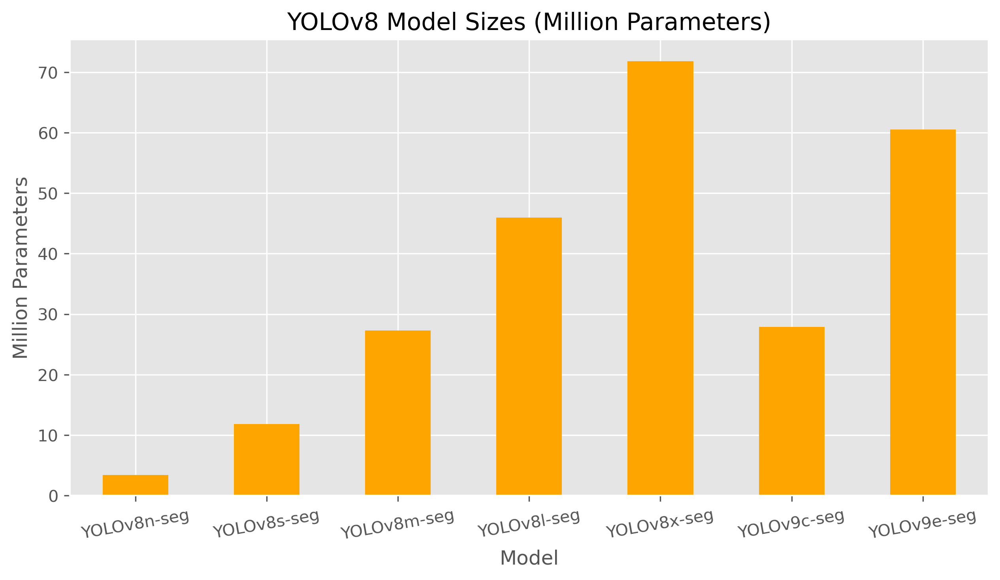

In [8]:
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
yoloSizes['params (M)'].plot(
    kind='bar', 
    title='YOLOv8 Model Sizes (Million Parameters)', 
    ylabel='Million Parameters', 
    xlabel='Model', 
    figsize=(10, 5), 
    grid=True, 
    color='orange', 
    rot=10,
    ax = ax,
    )

    'epoch',                # number of epoch
    'train/box_loss',       # loss for bounding box
    'train/seg_loss',       # loss for segmentation
    'train/cls_loss',       # loss for classification
    'train/dfl_loss',       # loss for deformable convolutions
    'metrics/precision(B)', # precision for bounding box
    'metrics/recall(B)',    # recall for bounding box
    'metrics/mAP50(B)',     # mean average precision for bounding box
    'metrics/mAP50-95(B)',  # mean average precision for bounding box
    'metrics/precision(M)', # precision for mask
    'metrics/recall(M)',    # recall for mask
    'metrics/mAP50(M)',     # mean average precision for mask
    'metrics/mAP50-95(M)',  # mean average precision for mask
    'val/box_loss',         # loss for bounding box
    'val/seg_loss',         # loss for segmentation
    'val/cls_loss',         # loss for classification
    'val/dfl_loss',         # loss for deformable convolutions
    'lr/pg0',               # learning rate for first parameter group
    'lr/pg1',               # learning rate for second parameter group
    'lr/pg2',               # learning rate for third parameter group

# Functions to plot the metrics

In [9]:
column_plot_combinations = {
    'train loss': ['train/seg_loss'],
    'val loss': ['val/seg_loss'],
    'train and val loss': ['train/seg_loss', 'val/seg_loss'],
    'precision for mask': ['metrics/precision(M)'],
    'recall for mask': ['metrics/recall(M)'],
    'mean average position 50': ['metrics/mAP50(M)'],
    'mean average position 50-95': ['metrics/mAP50-95(M)'],
    'distribution focal loss': ['val/dfl_loss'],
}

desired_order = [
    'yolov8 nano_exp',
    'yolov8 small_exp',
    'yolov8 medium_exp',
    'yolov8 large_exp',
    'yolov8 xlarge_exp',
    'yolov9 c_exp'
]

model_colors = {
    'yolov8_nano': '#FF0000',      # Red
    'yolov8_small': '#0072B2',     # Blue
    'yolov8_medium': '#009E73',    # Green
    'yolov8_large': '#D55E00',     # Orange
    'yolov8_xlarge': '#CC79A7',    # Purple
    'yolov9_medium': '#F0E442'     # Yellow
}

def clean_data(df):
    df.columns = df.columns.str.strip()
    df = df.apply(pd.to_numeric, errors='coerce')
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.replace(0, np.nan, inplace=True)
    df.ffill(inplace=True)
    large_float_value = 10
    df.fillna(large_float_value, inplace=True)
    return df



def smooth_data(df, window=9):
    return df.rolling(window=window, min_periods=1).mean()


def display_KPI(csvs, json_data = None):
    selected_metrics = {
        'val/seg_loss': 'min',
        'metrics/precision(M)': 'max',
        'metrics/recall(M)': 'max',
        'metrics/mAP50(M)': 'max',
        'metrics/mAP50-95(M)': 'max',
        'val/dfl_loss': 'min'}
    minMax = pd.DataFrame()
    for key, value in csvs.items():
        df = pd.read_csv(value)
        # df = smooth_data(clean_data(df))
        df = clean_data(df)
        mins = df.min().rename(lambda x: f"{x}_min")
        maxs = df.max().rename(lambda x: f"{x}_max")
        min_max_df = pd.concat([mins, maxs])
        for metric, min_or_max in selected_metrics.items():
            if metric in df.columns:
                if min_or_max == 'min':
                    # min_value = df[metric].min()
                    min_epoch = df[metric].idxmin()
                    # min_max_df[f'{metric}_min'] = min_value
                    min_max_df[f'{metric}_min_epoch'] = min_epoch
                elif min_or_max == 'max':
                    # max_value = df[metric].max()
                    max_epoch = df[metric].idxmax()
                    # min_max_df[f'{metric}_max'] = max_value
                    min_max_df[f'{metric}_max_epoch'] = max_epoch
        min_vali_loss_epoch = df['val/seg_loss'].idxmin()
        min_max_df['val/seg_loss_min_epoch'] = min_vali_loss_epoch
        for metric in selected_metrics.keys():
            if metric in df.columns:
                min_max_df[f'{metric}_at_min_val_loss'] = df.at[min_vali_loss_epoch, metric]
        minMax[key] = min_max_df
    if json_data is not None:
        for key, value in json_data.items():
            # print(f'Processing JSON data for {key}')
            # print(f'File: {value}')
            json_df = pd.read_json(value, orient='index')
            json_df.index = [f"{idx}_test" for idx in json_df.index]
            for row in json_df.itertuples(index=True):
                minMax.at[row.Index, key] = row[1]
    return minMax


def precise_KPI(csvs, json_data=None):
    selected_metrics = {
        'val/seg_loss': 'min',
        'metrics/precision(M)': 'max',
        'metrics/recall(M)': 'max',
        'metrics/mAP50(M)': 'max',
        'metrics/mAP50-95(M)': 'max',
        'val/dfl_loss': 'min'}
    minMax = pd.DataFrame()
    for key, value in csvs.items():
        df = pd.read_csv(value)
        df = clean_data(df)
        min_vali_loss_epoch = df['val/seg_loss'].idxmin()
        metrics_dict = {'lowset val. seg. loss epoch': min_vali_loss_epoch}
        for metric in selected_metrics.keys():
            if metric in df.columns:
                metrics_dict[f'{metric}_@_epoch'] = df.at[min_vali_loss_epoch, metric]
        minMax[key] = pd.Series(metrics_dict)
    if json_data is not None:
        for key, value in json_data.items():
            # print(f'Processing JSON data for {key}')
            # print(f'File: {value}')
            json_df = pd.read_json(value, orient='index')
            json_df.index = [f"{idx}_test" for idx in json_df.index]
            for row in json_df.itertuples(index=True):
                minMax.at[row.Index, key] = row[1]
    return minMax


def plot_dataframes(nano, small, medium, large, xlarge, c, column_plot_combinations, model_colors, save_path):
    for key, value in column_plot_combinations.items():
        plt.figure(figsize=(10, 7), dpi=150)
        for column in value:
            plt.plot(nano['epoch'], nano[column], label=f'yolov8_nano {column}', color=model_colors['yolov8_nano'])
            plt.plot(small['epoch'], small[column], label=f'yolov8_small {column}', color=model_colors['yolov8_small'])
            plt.plot(medium['epoch'], medium[column], label=f'yolov8_medium {column}', color=model_colors['yolov8_medium'])
            plt.plot(large['epoch'], large[column], label=f'yolov8_large {column}', color=model_colors['yolov8_large'])
            plt.plot(xlarge['epoch'], xlarge[column], label=f'yolov8_xlarge {column}', color=model_colors['yolov8_xlarge'])
            plt.plot(c['epoch'], c[column], label=f'yolov9_medium {column}', color=model_colors['yolov9_medium'])
        if "loss" in key:
            plt.ylim(0, 3)
        else:
            plt.ylim(0, 1.5)
        plt.xlabel('epoch')
        plt.ylabel('loss')
        plt.title(key)
        plt.legend()
        plt.tight_layout()
        SAVE_PATH = os.path.join(VIS_DIR, f'markdown_resultater_segmentering/{save_path}_{key}.png')
        plt.savefig(SAVE_PATH)
        plt.show()



In [10]:
json_df = pd.read_json(os.path.join(BASE_DIR, 'scape.v4i.yolov8_70-20-10/200_70-20-10_split_test/yolov8 nano_exp/results.json'), orient='index')
json_df

,0
metrics/precision(B),0.989809
metrics/recall(B),0.924370
metrics/mAP50(B),0.947975
metrics/mAP50-95(B),0.840358
metrics/precision(M),0.989809
metrics/recall(M),0.924370
metrics/mAP50(M),0.935205
metrics/mAP50-95(M),0.812558
fitness,1.675942


# Memory training usage

In [11]:
memmory_usage_gb_training = {
    'yolov8 nano_exp': 2.2,
    'yolov8 small_exp': 1.5,
    'yolov8 medium_exp': 2.5,
    'yolov8 large_exp': 4.5,
    'yolov8 xlarge_exp': 6.5,
    'yolov9 c_exp': 8.5
}

# scape.v2i.yolov8 - 50 epochs - original data

In [12]:
#filenames
Metrics_table = 'scape.v2i.yolov8-050-Metrics'
Metrics_plot  = 'scape.v2i.yolov8-050'

In [13]:
csv_base_path = os.path.join(BASE_DIR, 'scape.v2i.yolov8/50_benchmark')
csvs_folders = os.walk(csv_base_path)

csvs = OrderedDict((key, None) for key in desired_order)
for root, dirs, files in os.walk(csv_base_path):
    for file in files:
        if file.endswith(".csv"):
            key = root.split("/")[-1]
            if key in csvs:
                csvs[key] = os.path.join(root, file)

csvs = {k: v for k, v in csvs.items() if v is not None}

In [14]:
minMax = display_KPI(csvs)

display(minMax)

dfi.export(minMax, os.path.join(VIS_DIR, f'markdown_resultater_segmentering/{Metrics_table}.png'))

,yolov8 nano_exp,yolov8 small_exp,yolov8 medium_exp,yolov8 large_exp,yolov8 xlarge_exp,yolov9 c_exp
epoch_min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
train/box_loss_min,0.301570,0.244220,0.222840,0.216120,0.231540,0.302110
train/seg_loss_min,0.529080,0.428400,0.422130,0.457690,0.535800,0.717340
train/cls_loss_min,0.398270,0.216630,0.193950,0.219920,0.219460,0.296090
train/dfl_loss_min,0.781930,0.770850,0.766520,0.778790,0.784930,0.805910
metrics/precision(B)_min,0.028570,0.574790,0.121300,0.000480,0.000160,0.001270
metrics/recall(B)_min,0.620880,0.533780,0.061540,0.015380,0.005130,0.025640
metrics/mAP50(B)_min,0.036960,0.552420,0.179270,0.000240,0.000080,0.000700
metrics/mAP50-95(B)_min,0.022830,0.365590,0.158520,0.000050,0.000010,0.000180
metrics/precision(M)_min,0.027460,0.547180,0.132820,0.000320,0.000160,0.000160


<Axes: title={'center': 'YOLOv8/YOLOv9 Model Performance 50 benchmark'}, xlabel='Model', ylabel='Value'>

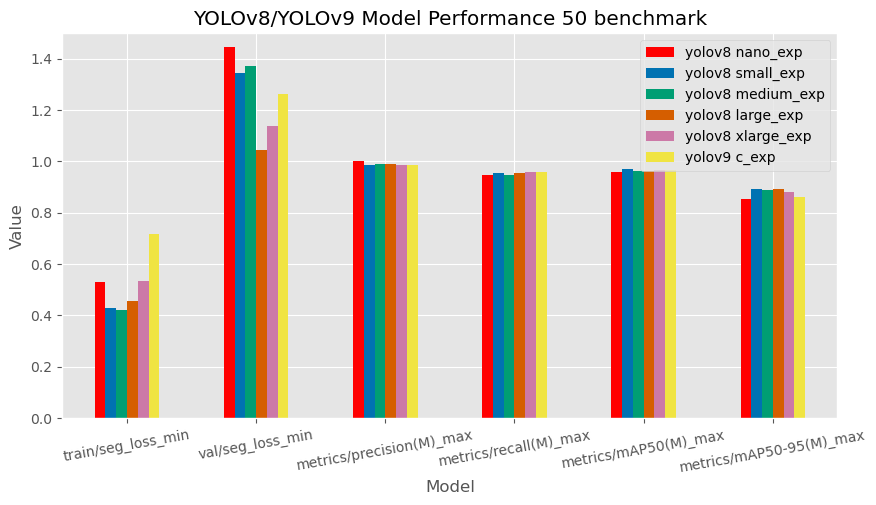

In [15]:
subset_minMax = minMax.loc[['train/seg_loss_min', 'val/seg_loss_min', 'metrics/precision(M)_max', 'metrics/recall(M)_max', 'metrics/mAP50(M)_max', 'metrics/mAP50-95(M)_max']]
subset_minMax.plot(
    kind='bar', 
    title='YOLOv8/YOLOv9 Model Performance 50 benchmark', 
    ylabel='Value', 
    xlabel='Model', 
    figsize=(10, 5), 
    grid=True, 
    rot=10,
    color=['#FF0000', '#0072B2', '#009E73', '#D55E00', '#CC79A7', '#F0E442'],
    ylim=(0, 1.5)
    )

In [16]:
# yolov8_nano = clean_data(pd.read_csv(csvs.get('yolov8 nano_exp')))
# yolov8_small = clean_data(pd.read_csv(csvs.get('yolov8 small_exp')))
# yolov8_medium = clean_data(pd.read_csv(csvs.get('yolov8 medium_exp')))
# yolov8_large = clean_data(pd.read_csv(csvs.get('yolov8 large_exp')))
# yolov8_xlarge = clean_data(pd.read_csv(csvs.get('yolov8 xlarge_exp')))
# yolov9_medium = clean_data(pd.read_csv(csvs.get('yolov9 c_exp')))

In [17]:
yolov8_nano = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 nano_exp'))))
yolov8_small = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 small_exp'))))
yolov8_medium = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 medium_exp'))))
yolov8_large = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 large_exp'))))
yolov8_xlarge = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 xlarge_exp'))))
yolov9_medium = smooth_data(clean_data(pd.read_csv(csvs.get('yolov9 c_exp'))))

In [18]:
# for key, value in column_plot_combinations.items():
#     for column in value:
#         print(f"yolo v8 nano {column}")
#         print(f"min {column}: {min(yolov8_nano[column])}, max {column}: {max(yolov8_nano[column])}")
#         print(f"yolov8 small {column}")
#         print(f"min {column}: {min(yolov8_small[column])}, max {column}: {max(yolov8_small[column])}")
#         print(f"yolov8 medium {column}")
#         print(f"min {column}: {min(yolov8_medium[column])}, max {column}: {max(yolov8_medium[column])}")
#         print(f"yolov8 large {column}")
#         print(f"min {column}: {min(yolov8_large[column])}, max {column}: {max(yolov8_large[column])}")
#         print(f"yolov8 xlarge {column}")
#         print(f"min {column}: {min(yolov8_xlarge[column])}, max {column}: {max(yolov8_xlarge[column])}")
#         print(f"yolov9 medium {column}")
#         print(f"min {column}: {min(yolov9_medium[column])}, max {column}: {max(yolov9_medium[column])}")
#         print()

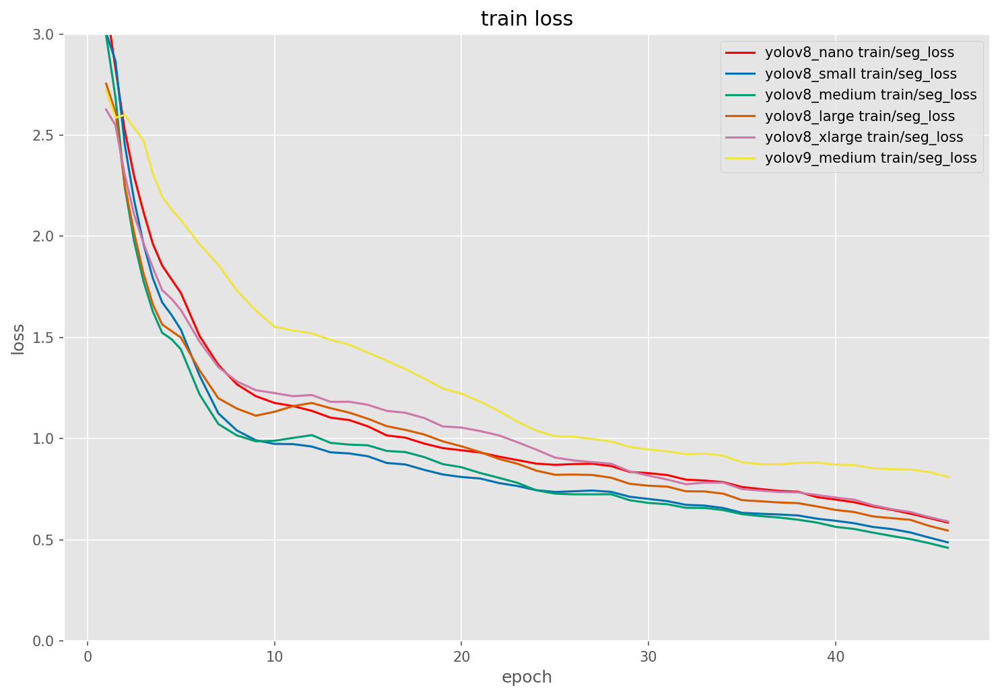

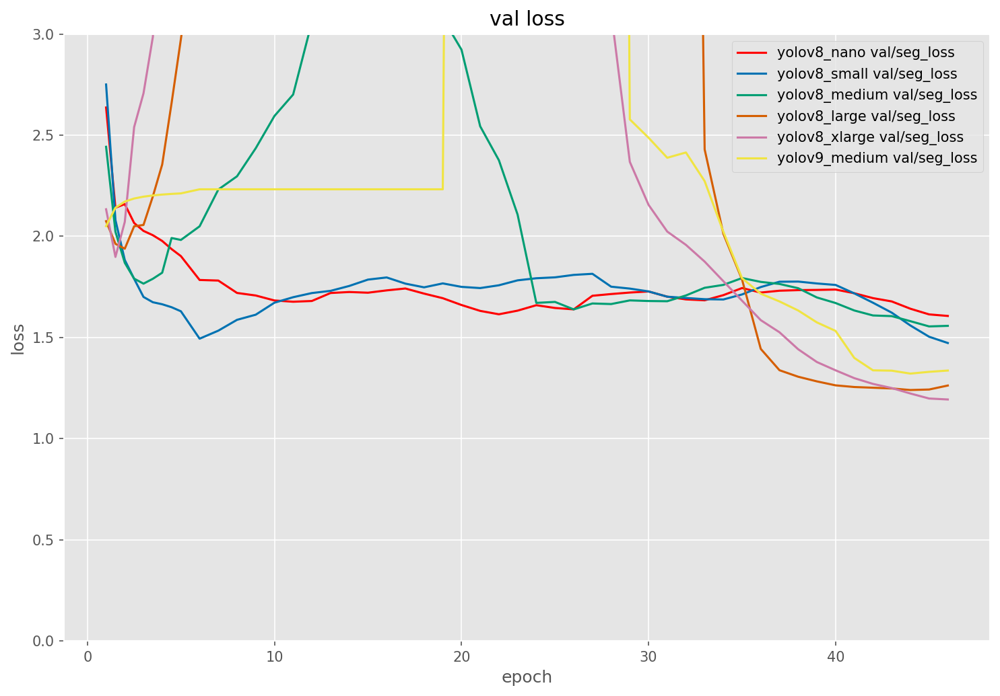

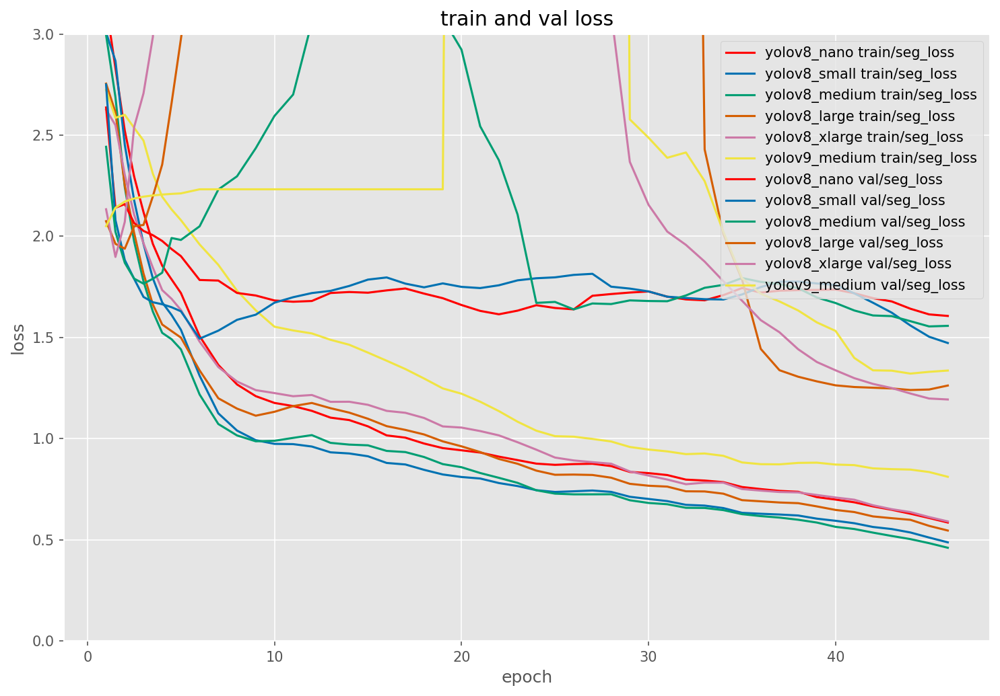

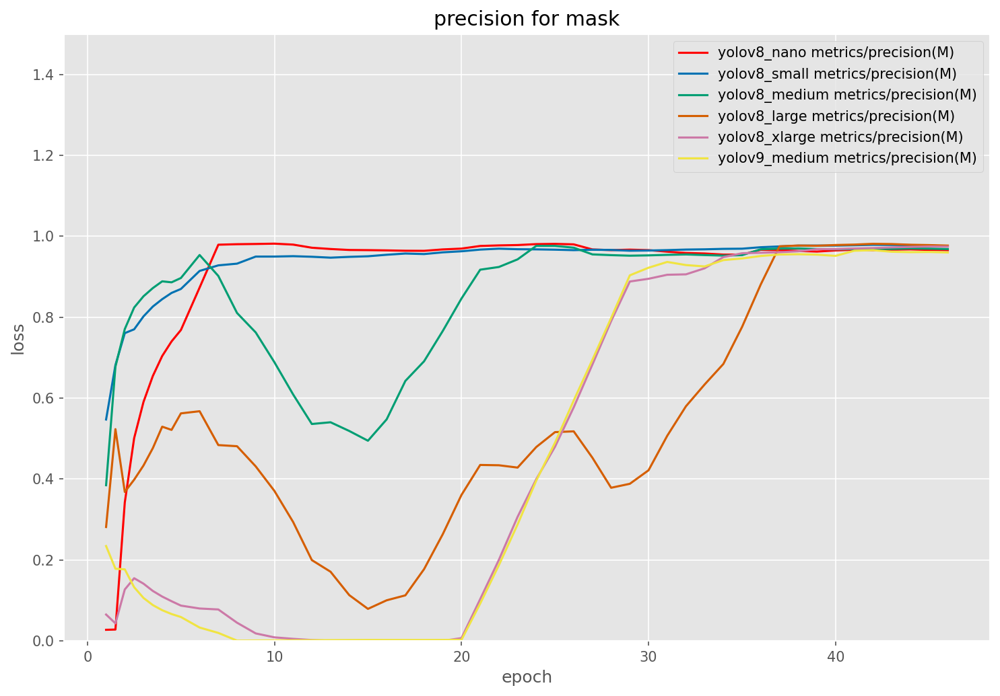

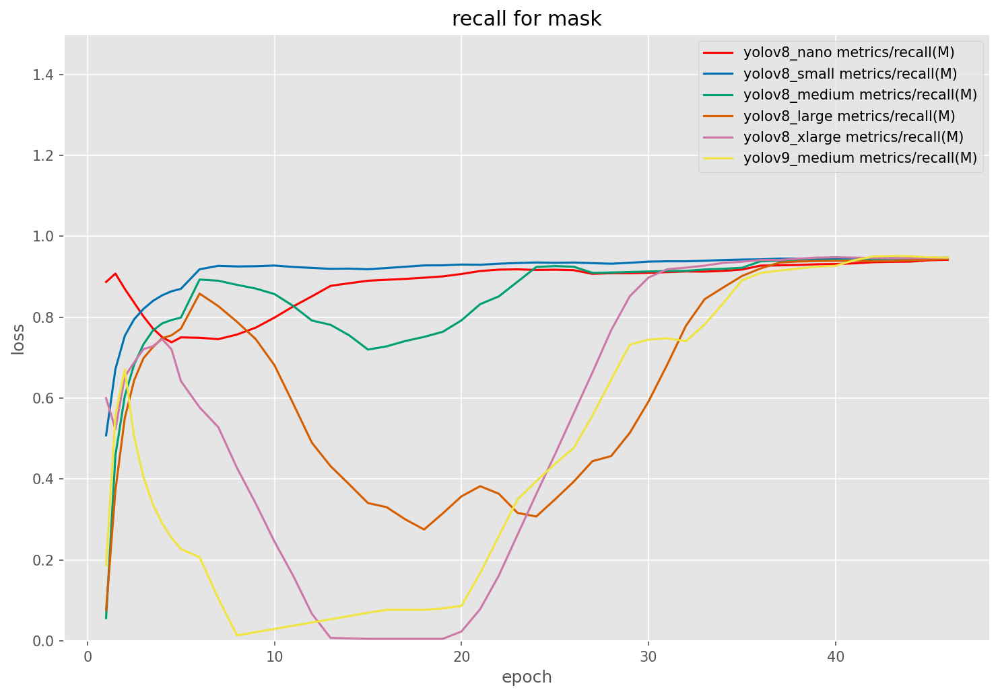

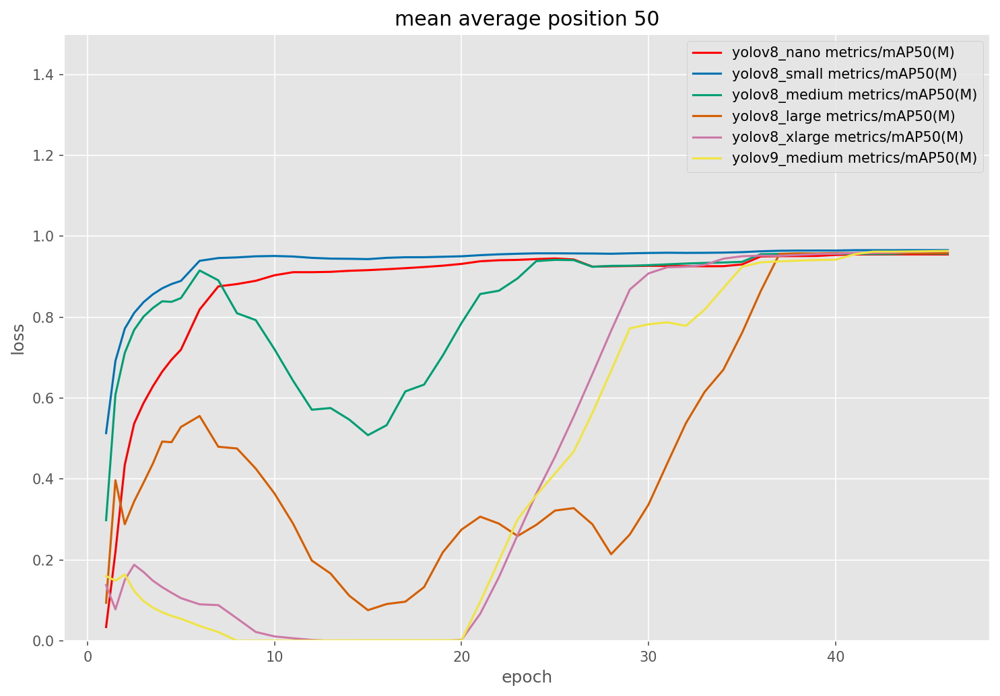

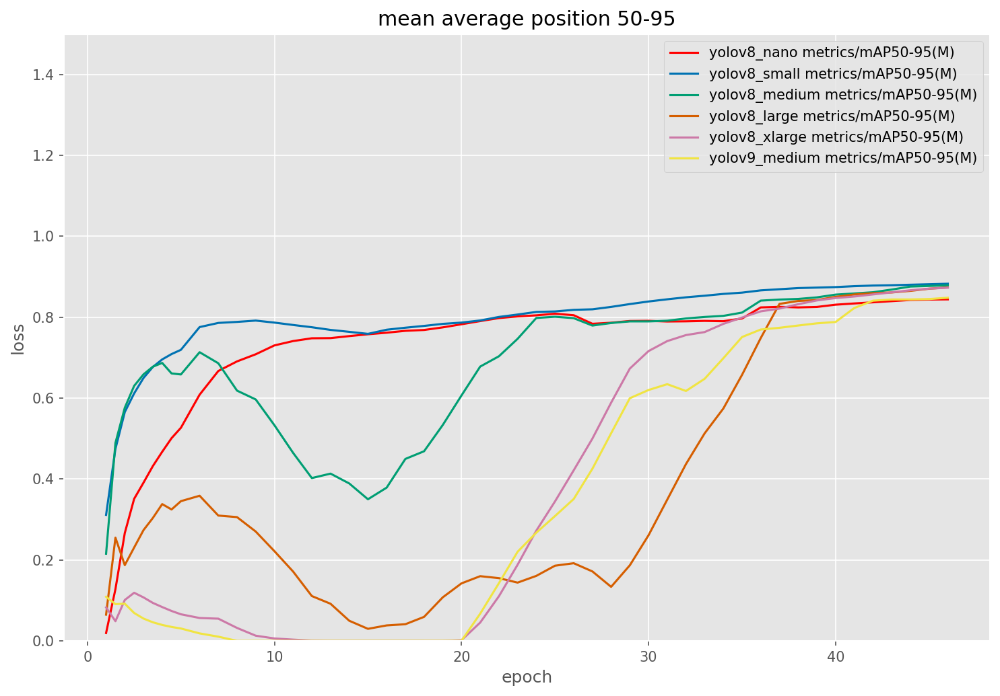

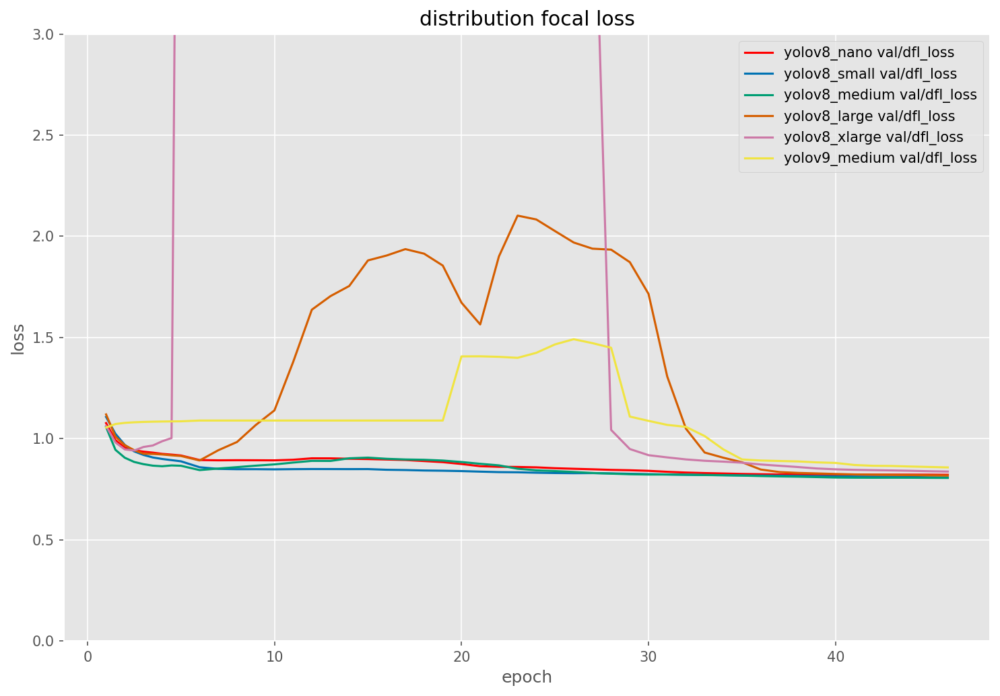

In [19]:
plot_dataframes(yolov8_nano, yolov8_small, yolov8_medium, yolov8_large, yolov8_xlarge, yolov9_medium, column_plot_combinations, model_colors, Metrics_plot)

# scape.v2i.yolov8 - 200 epoch - original data

In [20]:
#filenames
Metrics_table = 'scape.v2i.yolov8-200-Metrics'
Metrics_plot  = 'scape.v2i.yolov8-200'

In [21]:
csv_base_path = os.path.join(BASE_DIR, 'scape.v2i.yolov8/200_benchmark')
csvs_folders = os.walk(csv_base_path)

csvs = OrderedDict((key, None) for key in desired_order)
for root, dirs, files in os.walk(csv_base_path):
    for file in files:
        if file.endswith(".csv"):
            key = root.split("/")[-1]
            if key in csvs:
                csvs[key] = os.path.join(root, file)

csvs = {k: v for k, v in csvs.items() if v is not None}

In [22]:
minMax = display_KPI(csvs)

display(minMax)

dfi.export(minMax, os.path.join(VIS_DIR, f'markdown_resultater_segmentering/{Metrics_table}.png'))

,yolov8 nano_exp,yolov8 small_exp,yolov8 medium_exp,yolov8 large_exp,yolov8 xlarge_exp,yolov9 c_exp
epoch_min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
train/box_loss_min,0.221780,0.176710,0.154140,0.164320,0.170150,0.201260
train/seg_loss_min,0.388740,0.320250,0.289740,0.322300,0.319450,0.412970
train/cls_loss_min,0.214800,0.158110,0.141640,0.149480,0.155420,0.192880
train/dfl_loss_min,0.759310,0.752100,0.750120,0.758680,0.794740,0.784820
metrics/precision(B)_min,0.028570,0.574790,0.003120,0.001280,0.000160,0.000790
metrics/recall(B)_min,0.645000,0.533780,0.061540,0.041030,0.005130,0.020510
metrics/mAP50(B)_min,0.036960,0.552420,0.001670,0.000660,0.000080,0.000410
metrics/mAP50-95(B)_min,0.022830,0.365590,0.001370,0.000300,0.000020,0.000120
metrics/precision(M)_min,0.027460,0.547180,0.003120,0.000220,0.000480,0.000160


<Axes: title={'center': 'YOLOv8/YOLOv9 Model Performance 200 benchmark'}, xlabel='Model', ylabel='Value'>

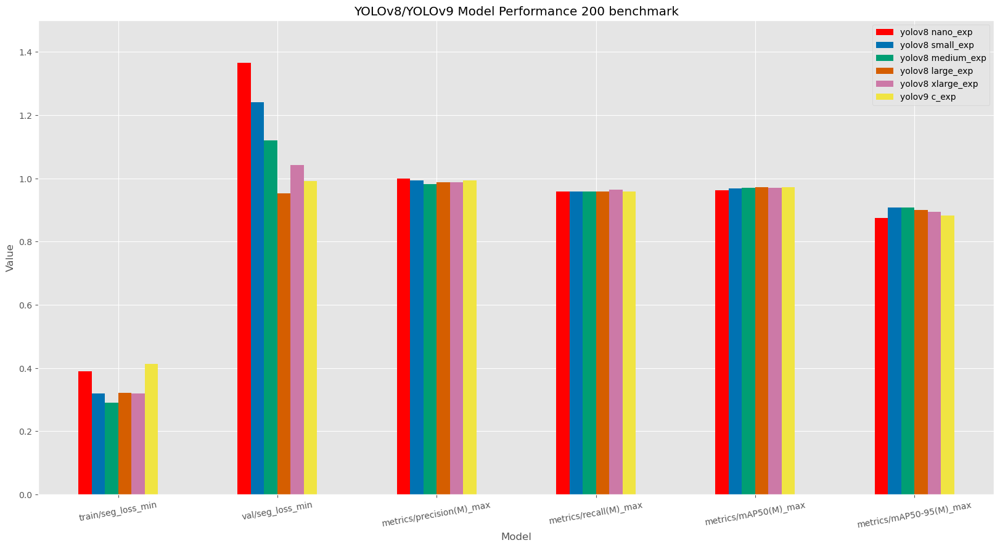

In [23]:
subset_minMax = minMax.loc[['train/seg_loss_min', 'val/seg_loss_min', 'metrics/precision(M)_max', 'metrics/recall(M)_max', 'metrics/mAP50(M)_max', 'metrics/mAP50-95(M)_max']]
subset_minMax.plot(
    kind='bar', 
    title='YOLOv8/YOLOv9 Model Performance 200 benchmark', 
    ylabel='Value', 
    xlabel='Model', 
    figsize=(20, 10), 
    grid=True, 
    rot=10,
    color=['#FF0000', '#0072B2', '#009E73', '#D55E00', '#CC79A7', '#F0E442'],
    ylim=(0, 1.5)
    )

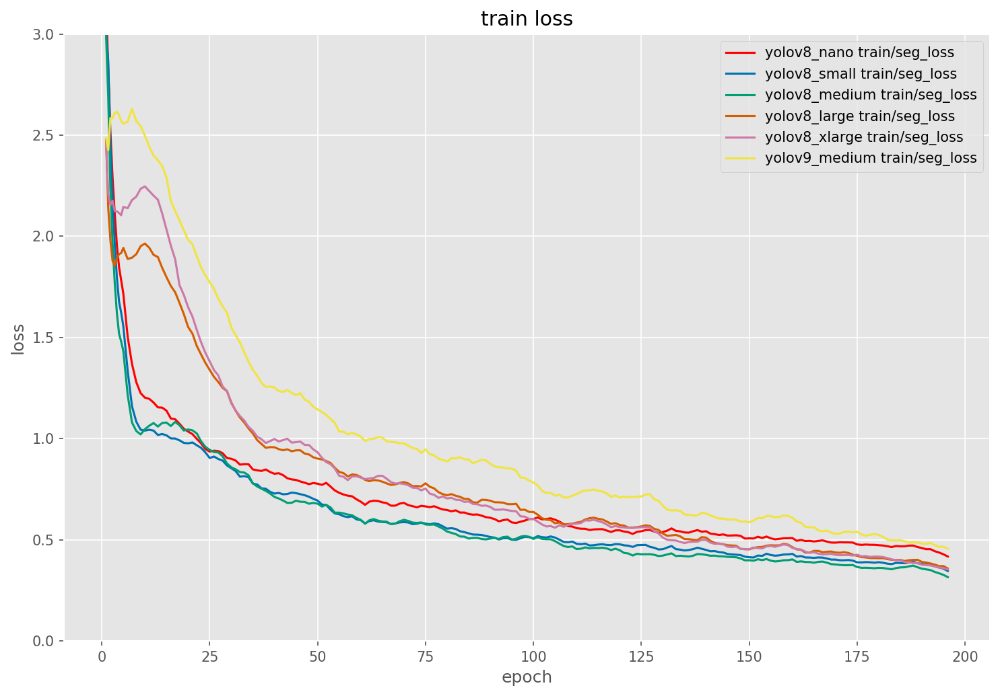

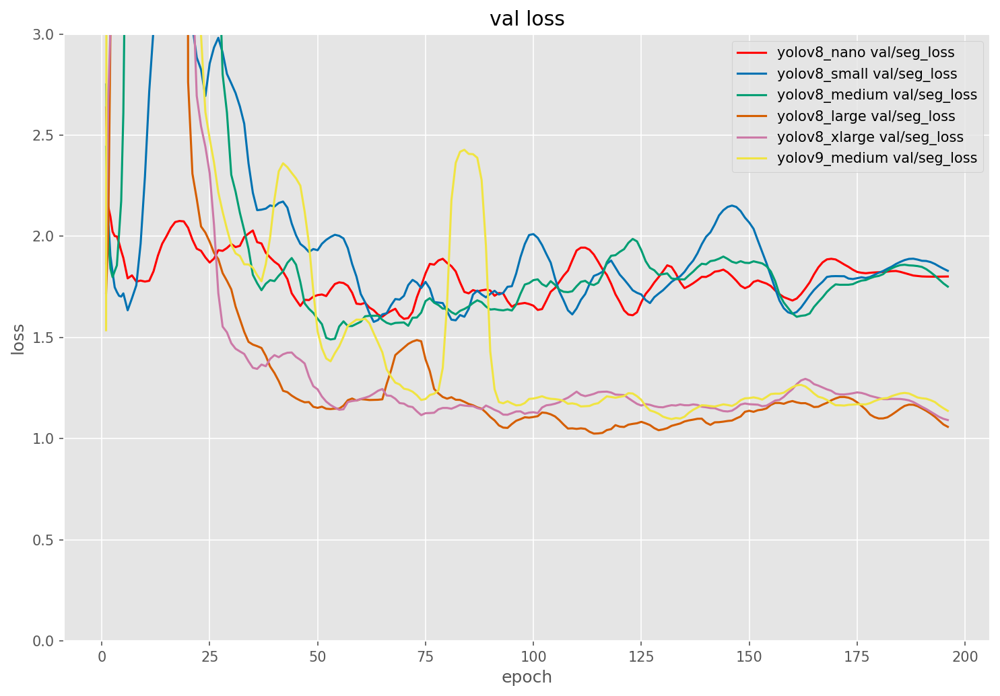

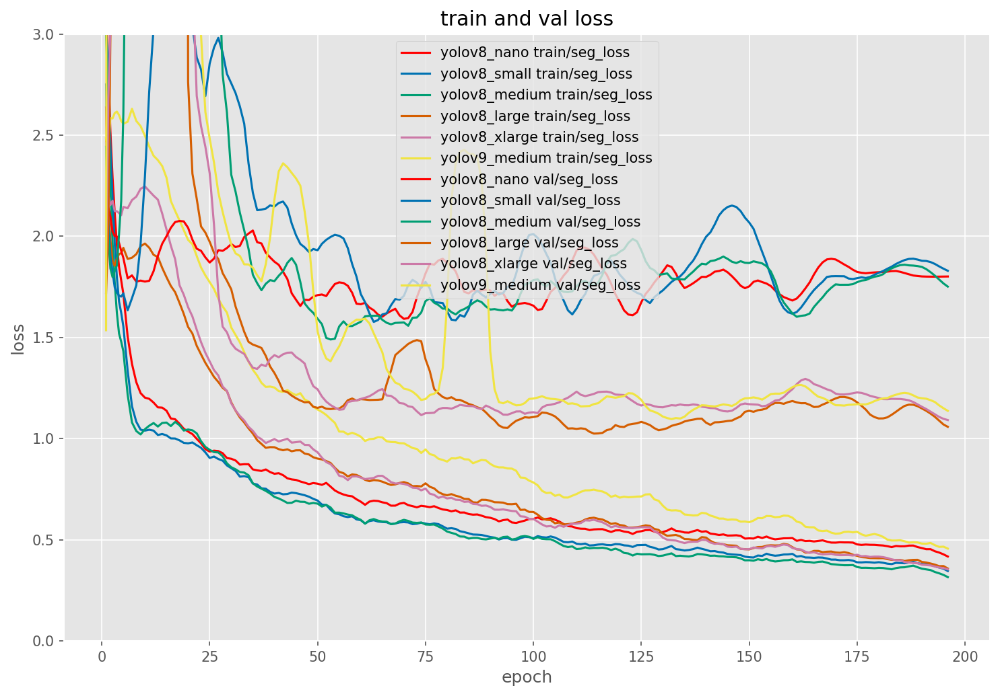

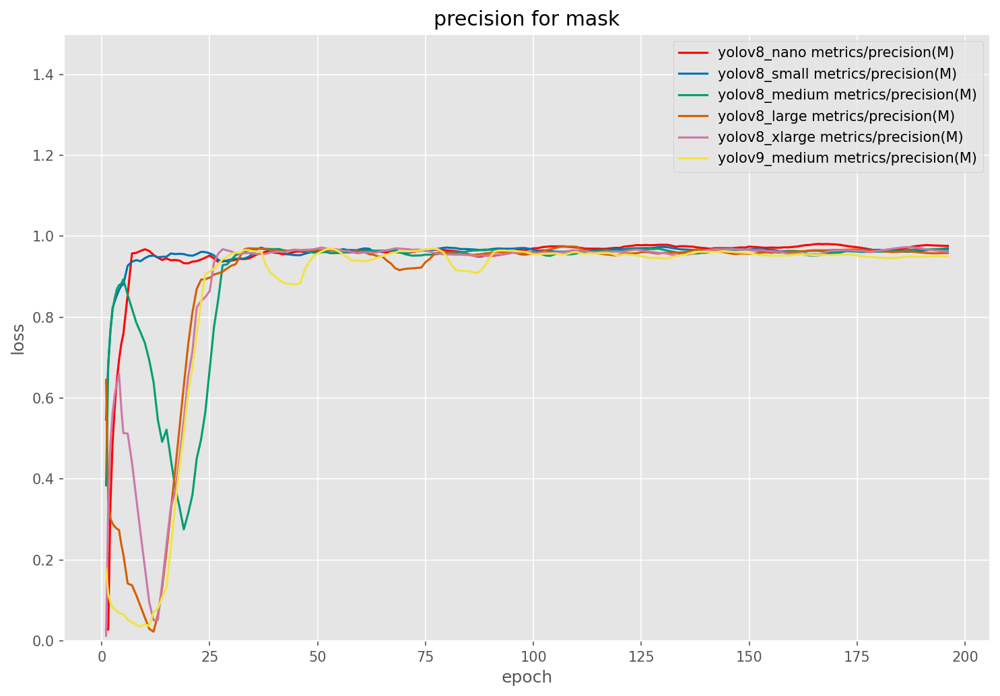

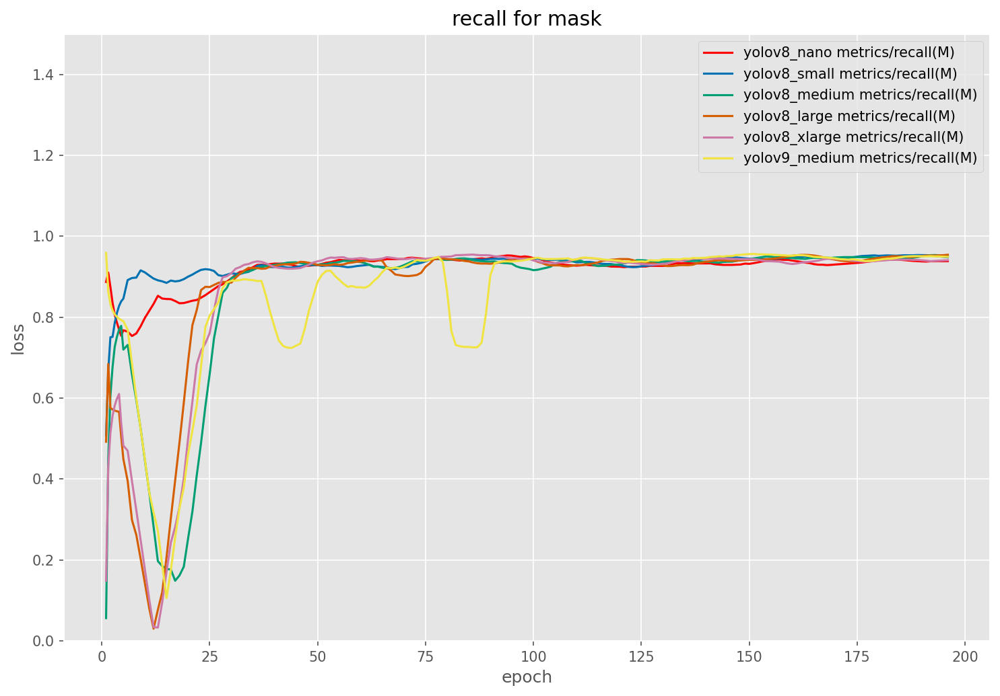

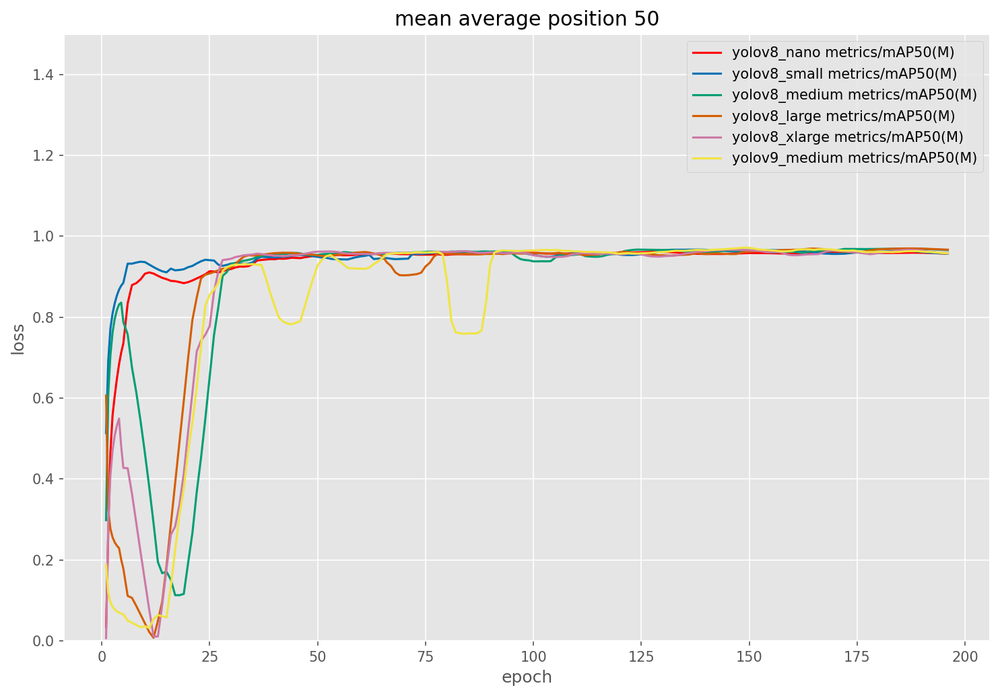

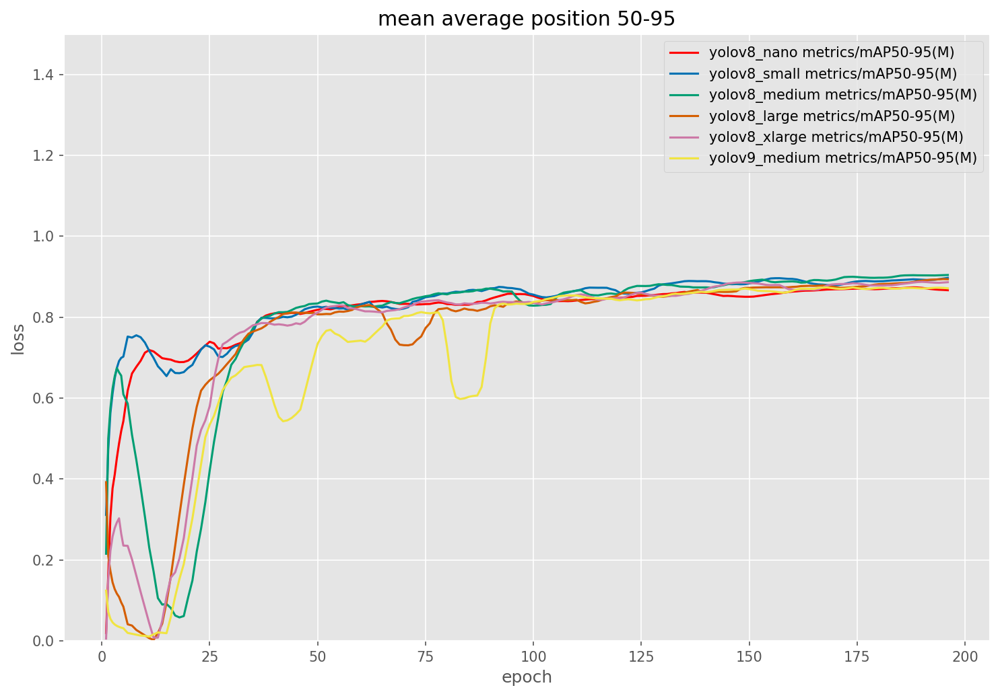

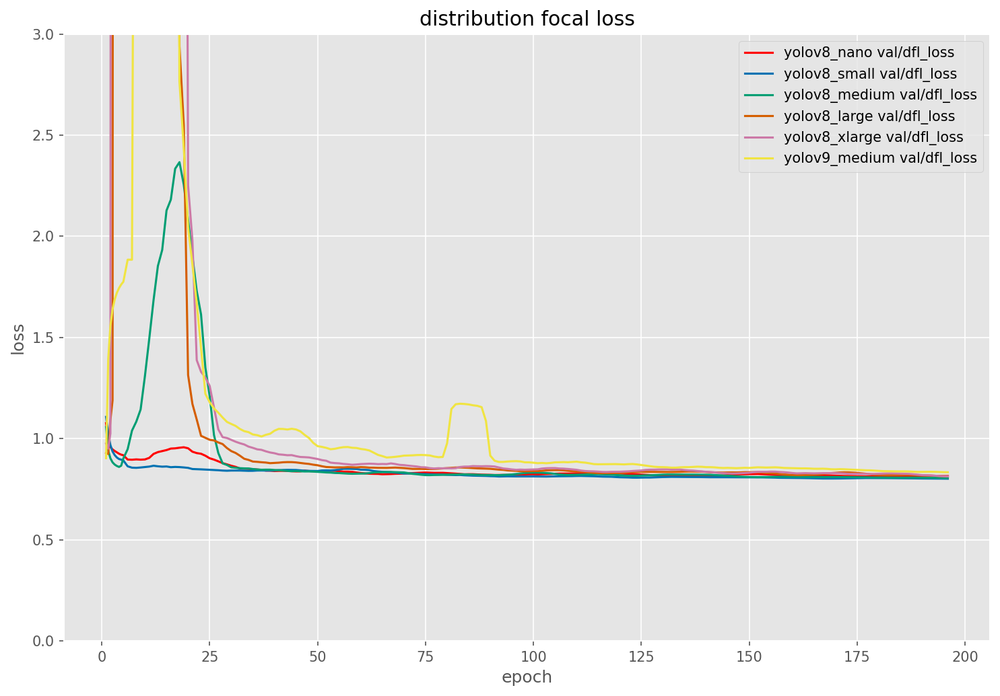

In [24]:
yolov8_nano = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 nano_exp'))))
yolov8_small = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 small_exp'))))
yolov8_medium = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 medium_exp'))))
yolov8_large = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 large_exp'))))
yolov8_xlarge = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 xlarge_exp'))))
yolov9_medium = smooth_data(clean_data(pd.read_csv(csvs.get('yolov9 c_exp'))))

plot_dataframes(yolov8_nano, yolov8_small, yolov8_medium, yolov8_large, yolov8_xlarge, yolov9_medium, column_plot_combinations, model_colors, Metrics_plot)

# scape.v3i.yolov8-augmented - 200 epoch - augmented

In [25]:
#filenames
Metrics_table = 'scape.v3i.yolov8-augmented-200-Metrics'
Metrics_plot  = 'scape.v3i.yolov8-augmented-200'

In [26]:
csv_base_path = os.path.join(BASE_DIR, 'scape.v3i.yolov8-augmented/200_benchmark_augmented')
csvs_folders = os.walk(csv_base_path)

csvs = OrderedDict((key, None) for key in desired_order)
for root, dirs, files in os.walk(csv_base_path):
    for file in files:
        if file.endswith(".csv"):
            key = root.split("/")[-1]
            if key in csvs:
                csvs[key] = os.path.join(root, file)

csvs = {k: v for k, v in csvs.items() if v is not None}

In [27]:
minMax = display_KPI(csvs)

display(minMax)

dfi.export(minMax, os.path.join(VIS_DIR, 'markdown_resultater_segmentering/{Metrics_table}.png'))

,yolov8 nano_exp,yolov8 small_exp,yolov8 medium_exp,yolov8 large_exp,yolov8 xlarge_exp,yolov9 c_exp
epoch_min,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000
train/box_loss_min,0.22687,0.18793,0.16053,0.15164,0.14947,0.19506
train/seg_loss_min,0.40984,0.35015,0.32229,0.32493,0.32353,0.37822
train/cls_loss_min,0.17659,0.14572,0.12793,0.12922,0.11822,0.16679
train/dfl_loss_min,0.78268,0.77459,0.76846,0.76831,0.77035,0.79501
metrics/precision(B)_min,0.90581,0.10375,0.10182,0.00158,0.00070,0.00246
metrics/recall(B)_min,0.66857,0.85218,0.76571,0.05143,0.02286,0.08000
metrics/mAP50(B)_min,0.77678,0.10359,0.09866,0.00083,0.00041,0.00143
metrics/mAP50-95(B)_min,0.51467,0.08441,0.07889,0.00012,0.00004,0.00025
metrics/precision(M)_min,0.87333,0.07641,0.10030,0.00035,0.00053,0.00018


<Axes: title={'center': 'YOLOv8/YOLOv9 Model Performance 200 benchmark augmented'}, xlabel='Model', ylabel='Value'>

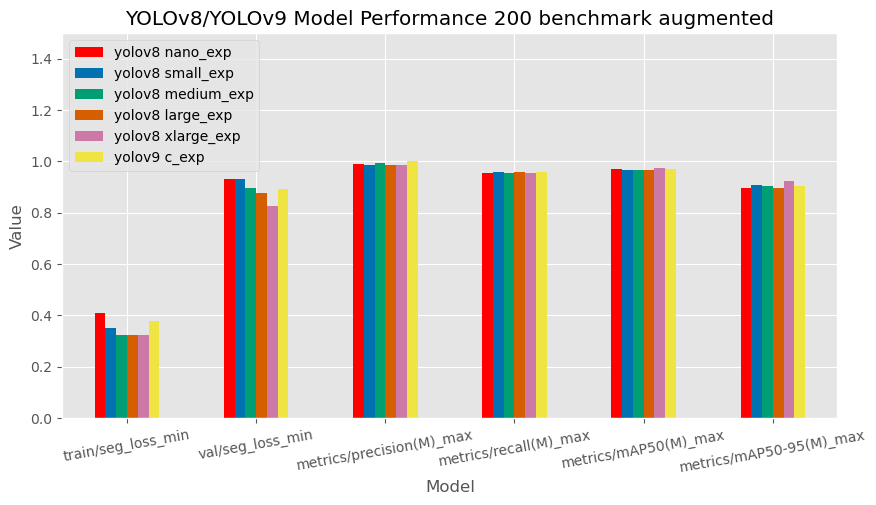

In [28]:
subset_minMax = minMax.loc[['train/seg_loss_min', 'val/seg_loss_min', 'metrics/precision(M)_max', 'metrics/recall(M)_max', 'metrics/mAP50(M)_max', 'metrics/mAP50-95(M)_max']]
subset_minMax.plot(
    kind='bar', 
    title='YOLOv8/YOLOv9 Model Performance 200 benchmark augmented', 
    ylabel='Value', 
    xlabel='Model', 
    figsize=(10, 5), 
    grid=True, 
    rot=10,
    color=['#FF0000', '#0072B2', '#009E73', '#D55E00', '#CC79A7', '#F0E442'],
    ylim=(0, 1.5)
    )

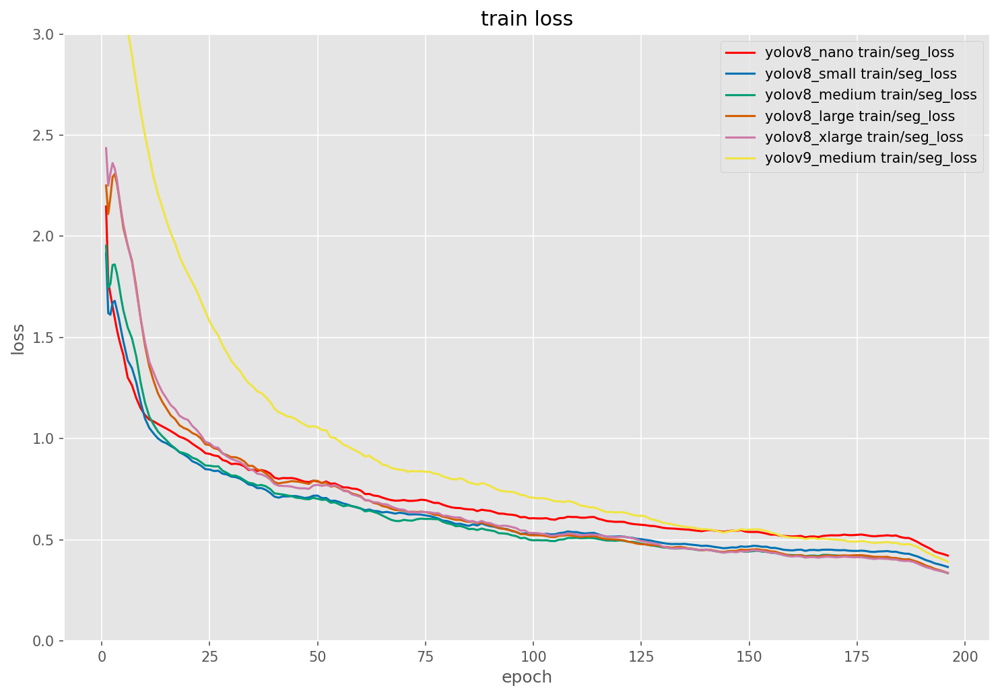

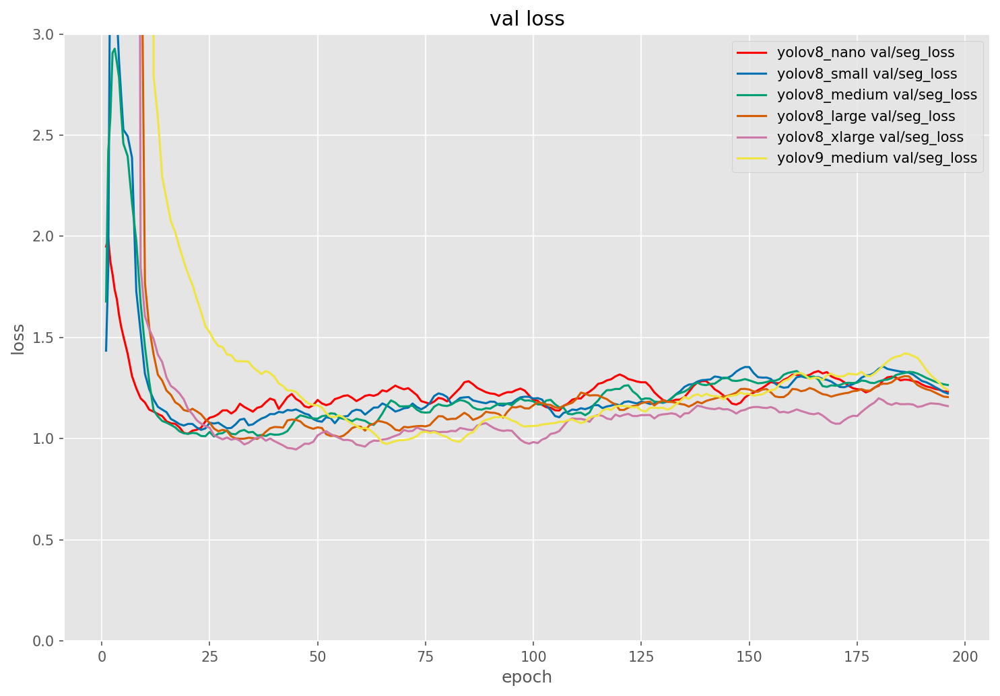

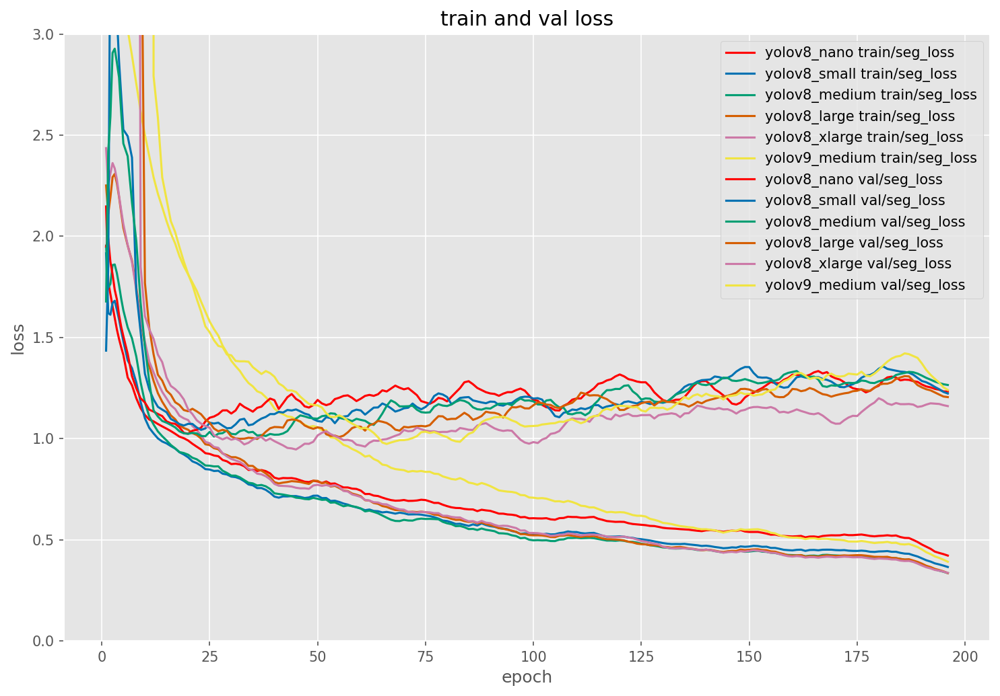

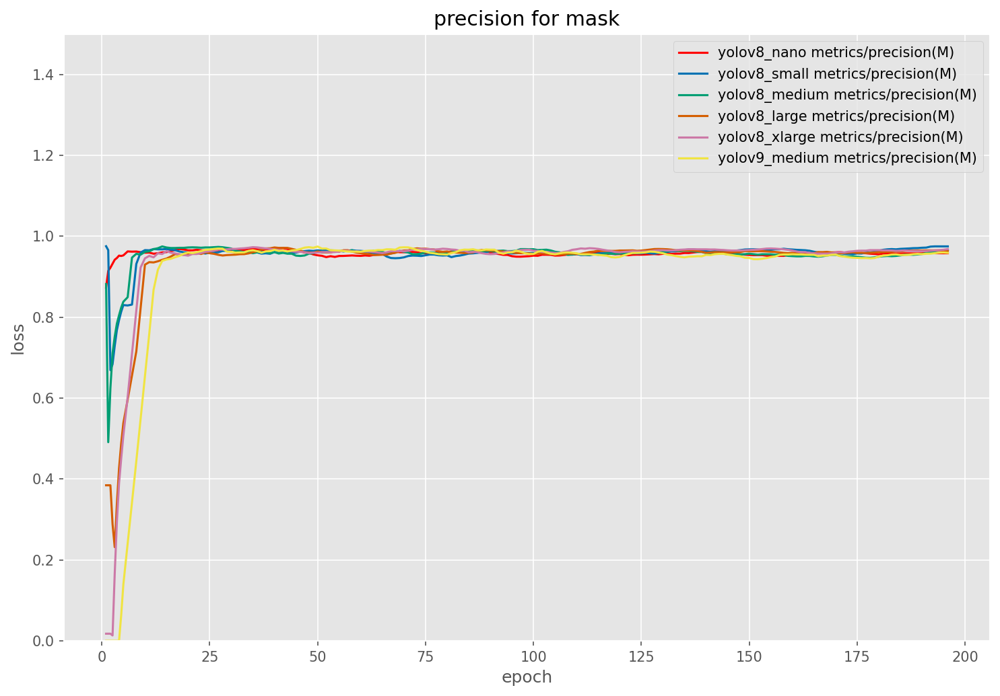

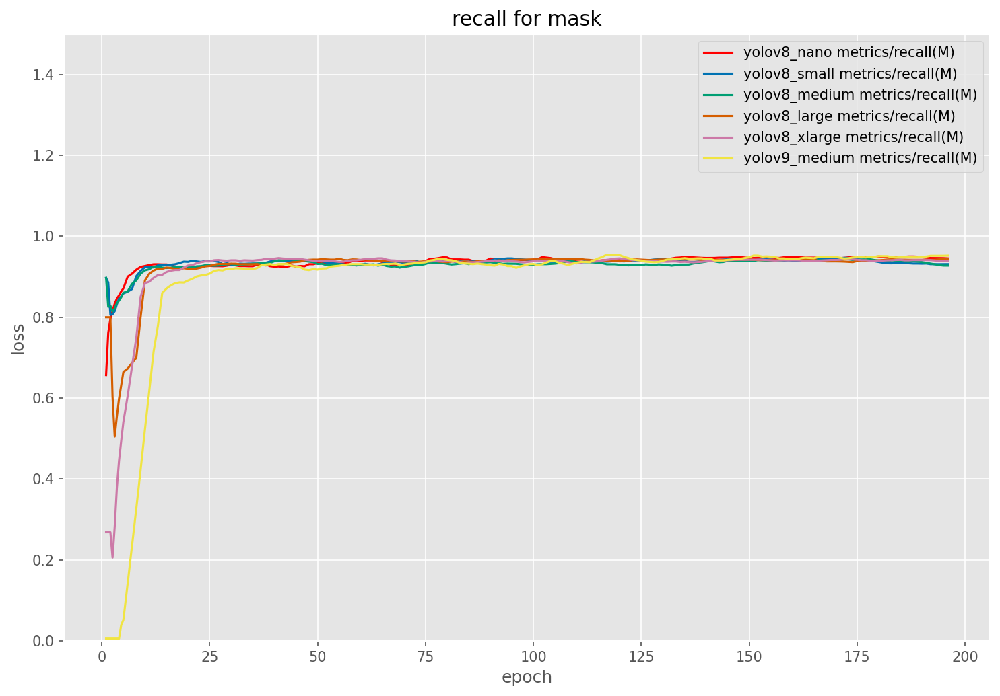

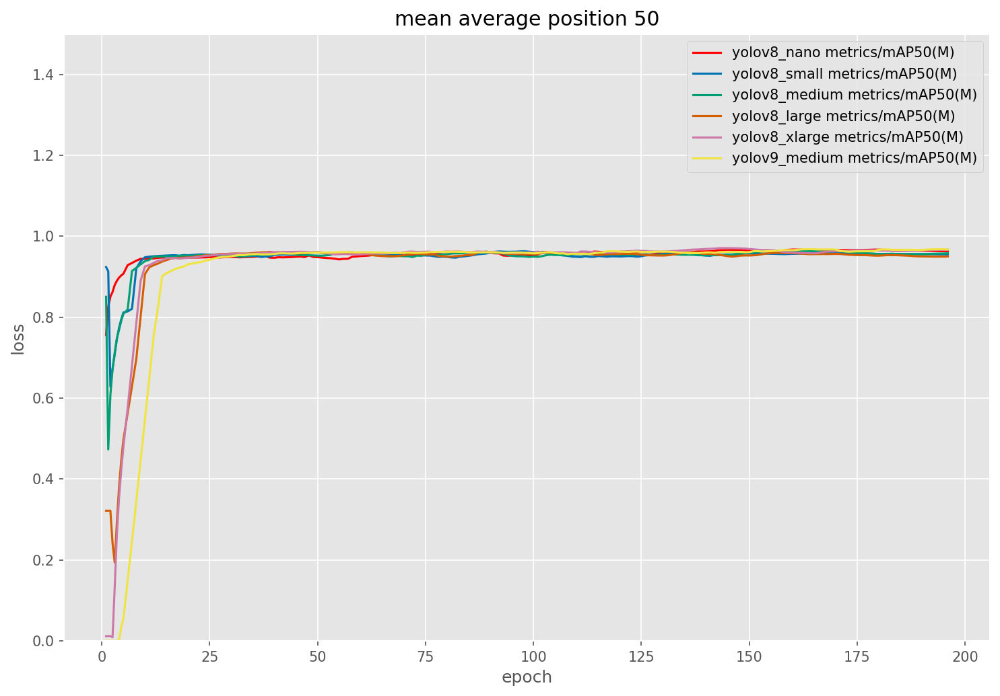

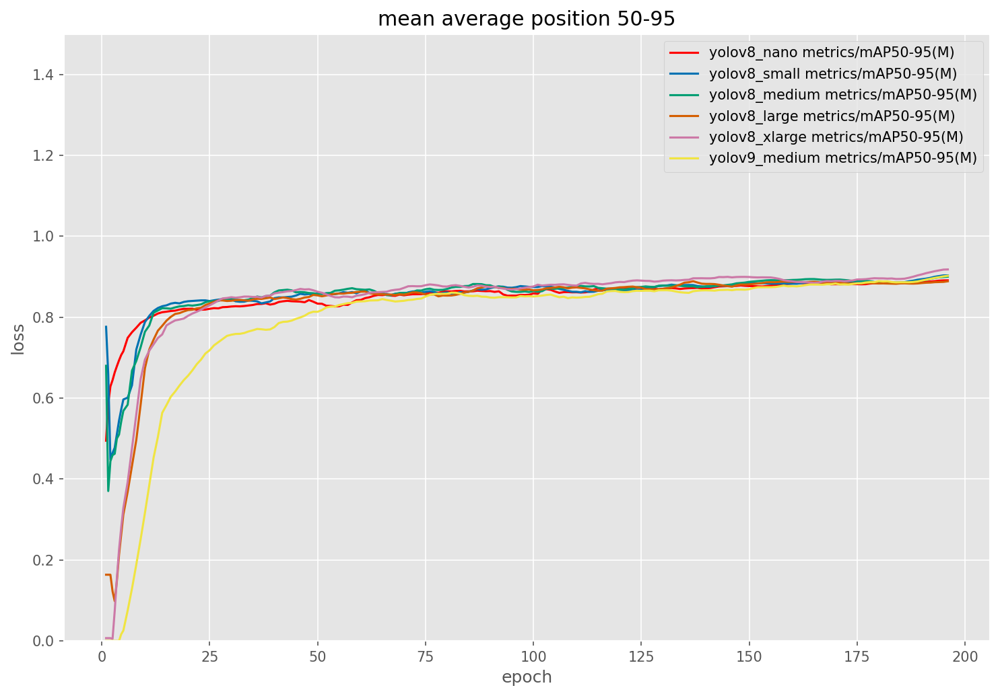

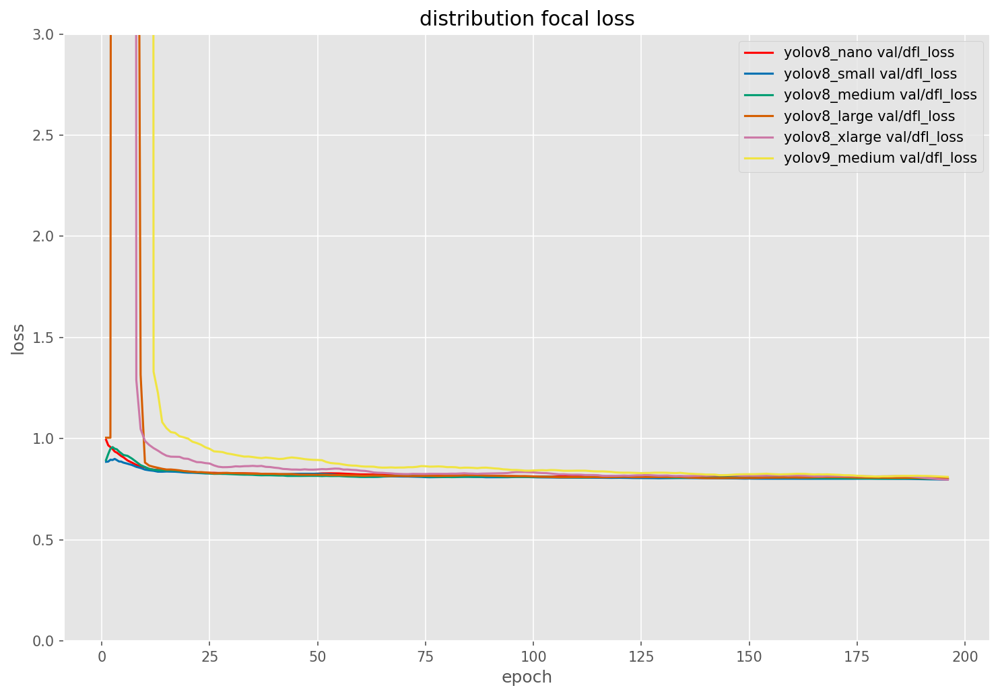

In [29]:
yolov8_nano = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 nano_exp'))))
yolov8_small = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 small_exp'))))
yolov8_medium = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 medium_exp'))))
yolov8_large = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 large_exp'))))
yolov8_xlarge = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 xlarge_exp'))))
yolov9_medium = smooth_data(clean_data(pd.read_csv(csvs.get('yolov9 c_exp'))))

plot_dataframes(yolov8_nano, yolov8_small, yolov8_medium, yolov8_large, yolov8_xlarge, yolov9_medium, column_plot_combinations, model_colors, Metrics_plot)

# scape.v3i.yolov8-augmented - 200 epoch - augmented single class

In [30]:
#filenames
Metrics_table = 'scape.v3i.yolov8-augmented-200-single-Metrics'
Metrics_plot  = 'scape.v3i.yolov8-augmented-200-single'

In [31]:
csv_base_path = os.path.join(BASE_DIR, 'scape.v3i.yolov8-augmented/200_single_benchmark_augmented')
csvs_folders = os.walk(csv_base_path)

csvs = OrderedDict((key, None) for key in desired_order)
for root, dirs, files in os.walk(csv_base_path):
    for file in files:
        if file.endswith(".csv"):
            key = root.split("/")[-1]
            if key in csvs:
                csvs[key] = os.path.join(root, file)

csvs = {k: v for k, v in csvs.items() if v is not None}

In [32]:
minMax = display_KPI(csvs)

display(minMax)

dfi.export(minMax, os.path.join(VIS_DIR, f'markdown_resultater_segmentering/{Metrics_table}.png'))

,yolov8 nano_exp,yolov8 small_exp,yolov8 medium_exp,yolov8 large_exp,yolov8 xlarge_exp,yolov9 c_exp
epoch_min,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000
train/box_loss_min,0.22687,0.18793,0.16053,0.15164,0.14947,0.19506
train/seg_loss_min,0.40984,0.35015,0.32229,0.32493,0.32353,0.37822
train/cls_loss_min,0.17659,0.14572,0.12793,0.12922,0.11822,0.16679
train/dfl_loss_min,0.78268,0.77459,0.76846,0.76831,0.77035,0.79501
metrics/precision(B)_min,0.90581,0.10375,0.10182,0.00158,0.00070,0.00246
metrics/recall(B)_min,0.66857,0.85218,0.76571,0.05143,0.02286,0.08000
metrics/mAP50(B)_min,0.77678,0.10359,0.09866,0.00083,0.00041,0.00143
metrics/mAP50-95(B)_min,0.51467,0.08441,0.07889,0.00012,0.00004,0.00025
metrics/precision(M)_min,0.87333,0.07641,0.10030,0.00035,0.00053,0.00018


<Axes: title={'center': 'YOLOv8/YOLOv9 Model Performance 200 benchmark augmented single class'}, xlabel='Model', ylabel='Value'>

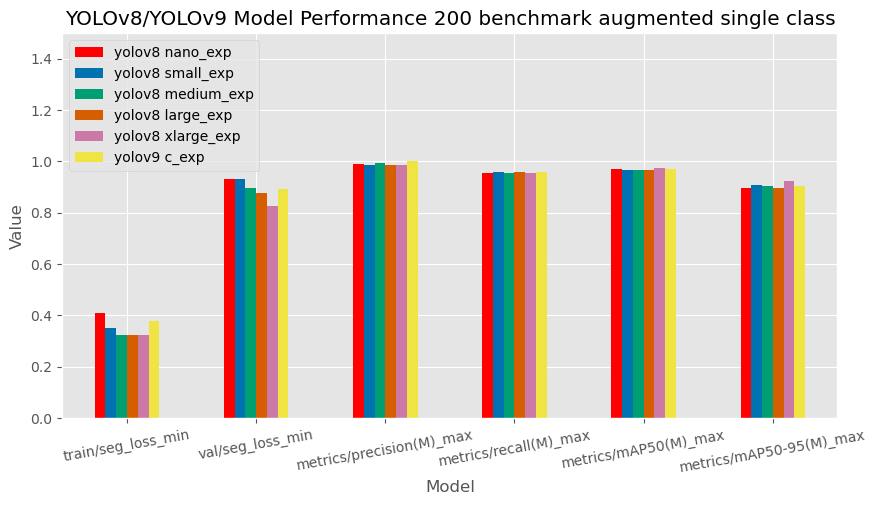

In [33]:
subset_minMax = minMax.loc[['train/seg_loss_min', 'val/seg_loss_min', 'metrics/precision(M)_max', 'metrics/recall(M)_max', 'metrics/mAP50(M)_max', 'metrics/mAP50-95(M)_max']]
subset_minMax.plot(
    kind='bar', 
    title='YOLOv8/YOLOv9 Model Performance 200 benchmark augmented single class', 
    ylabel='Value', 
    xlabel='Model', 
    figsize=(10, 5),
    grid=True, 
    rot=10,
    color=['#FF0000', '#0072B2', '#009E73', '#D55E00', '#CC79A7', '#F0E442'],
    ylim=(0, 1.5)
    )

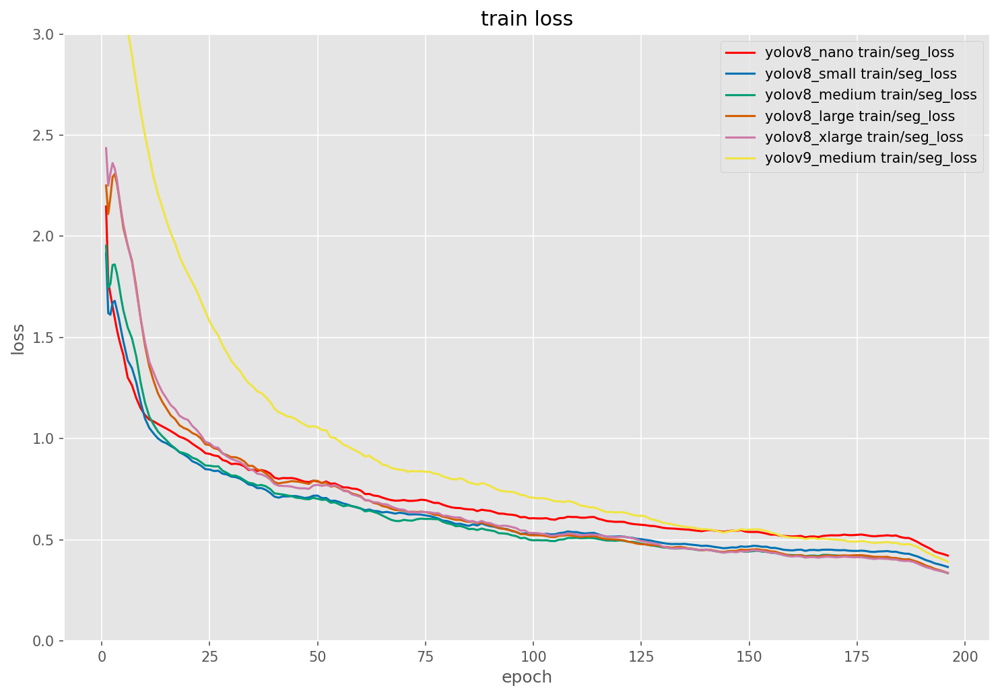

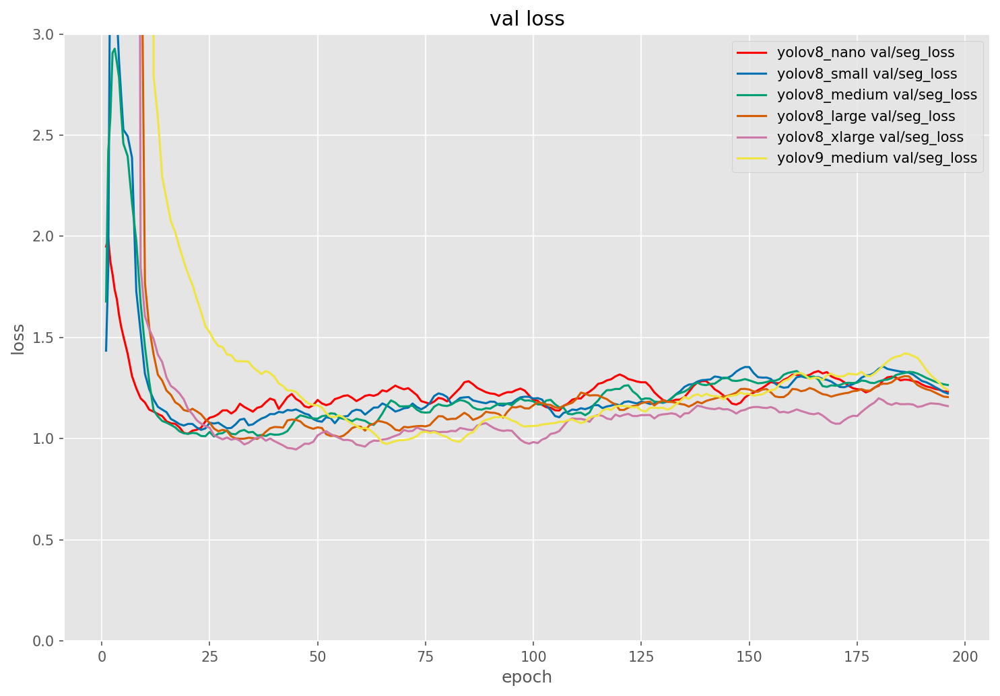

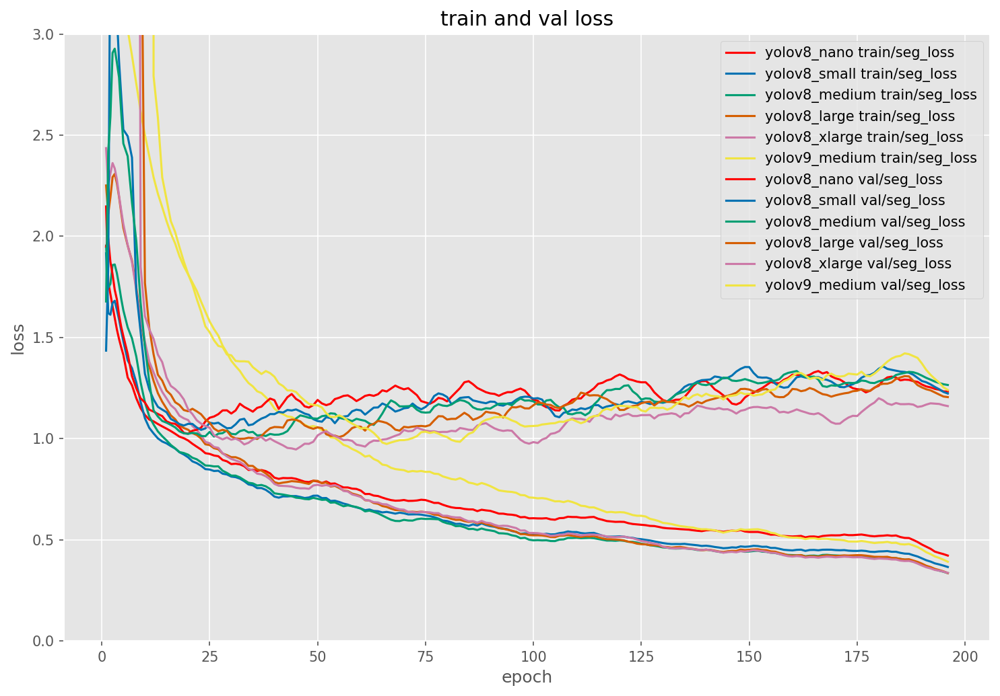

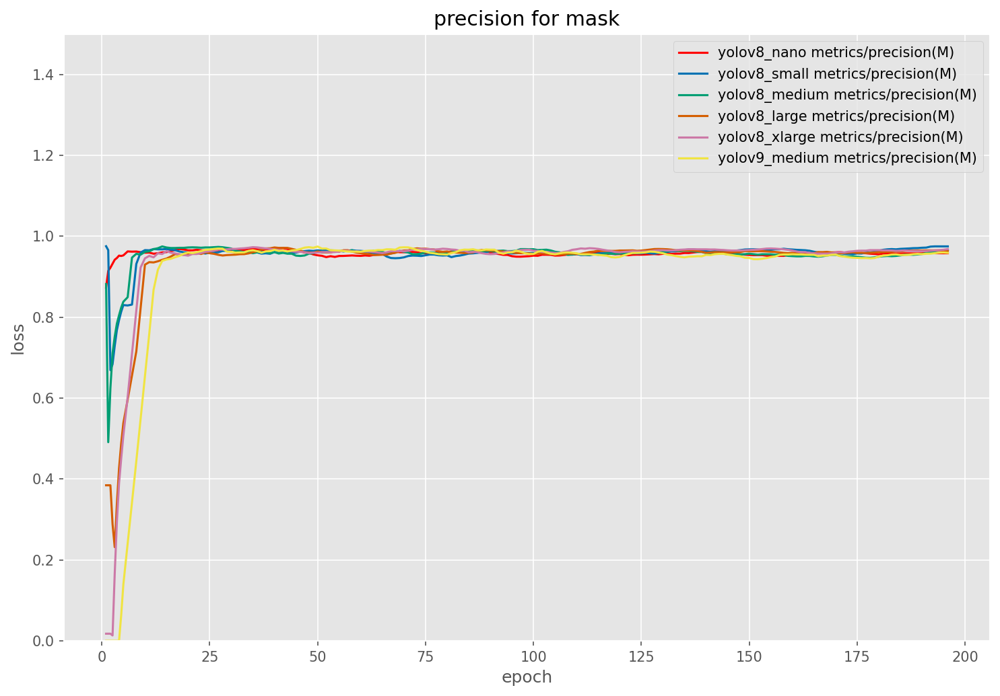

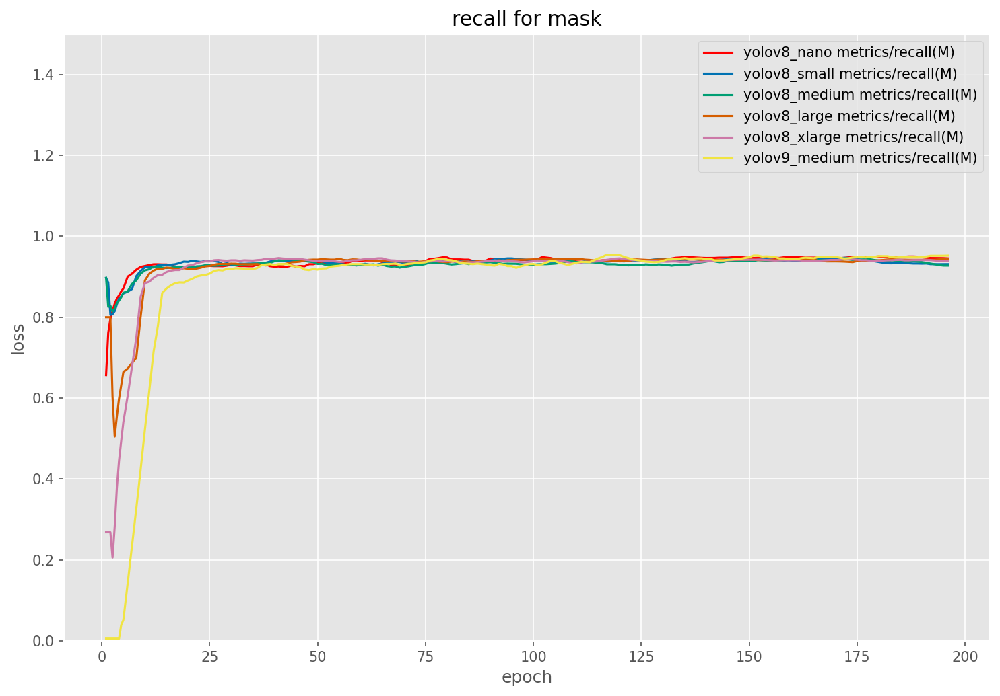

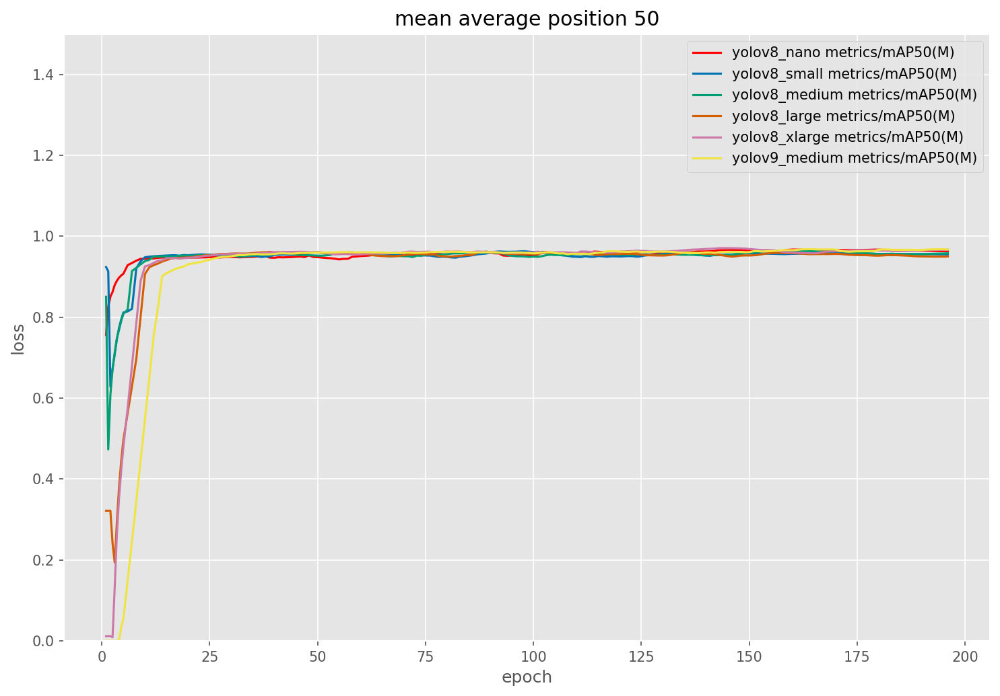

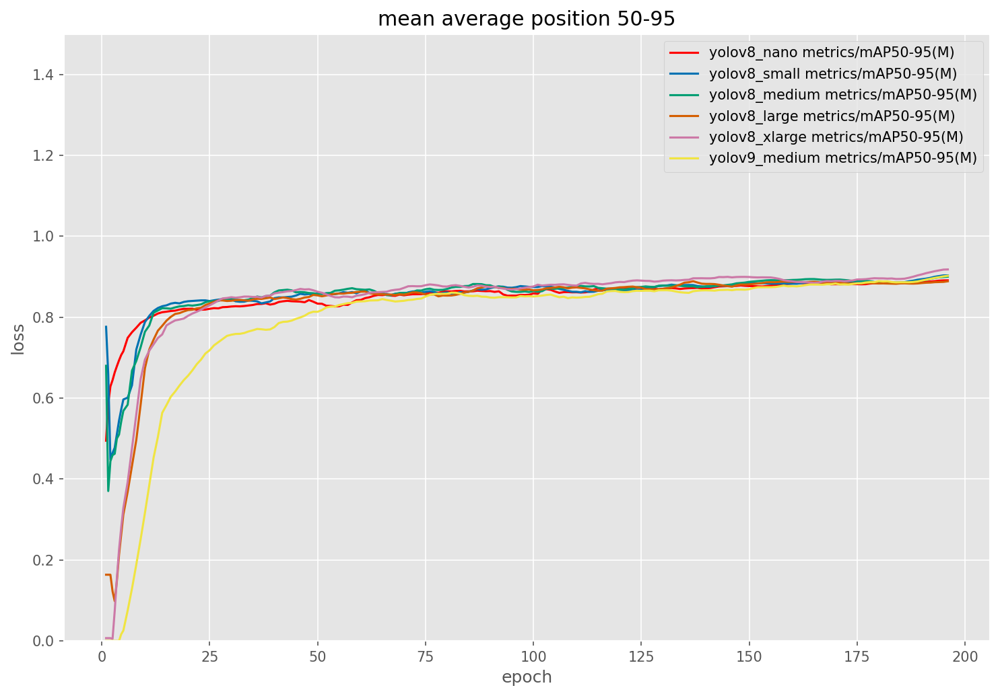

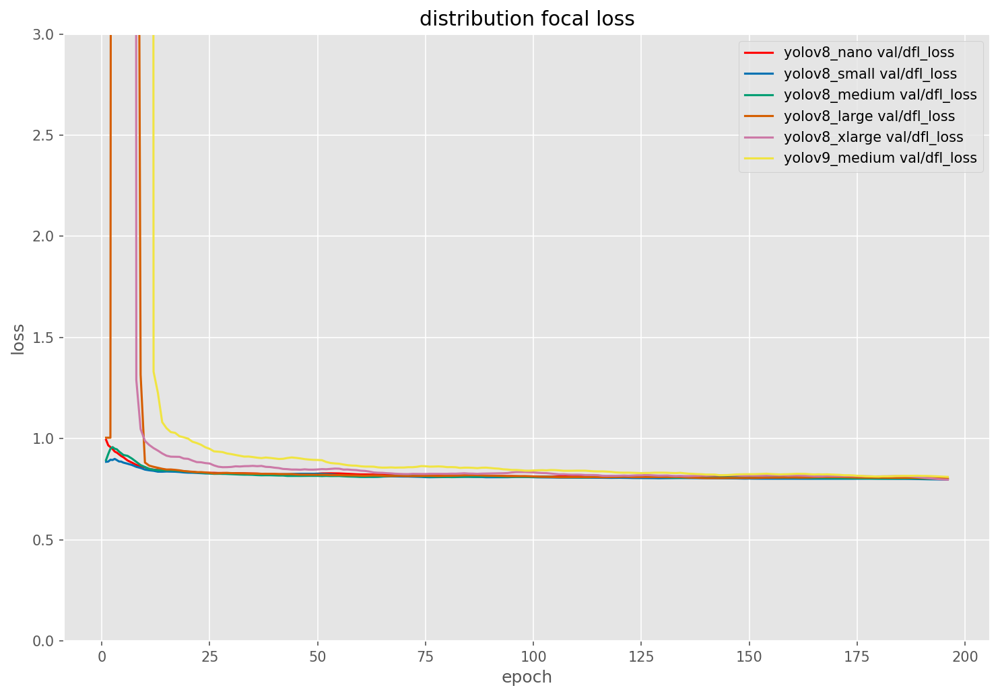

In [34]:
yolov8_nano = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 nano_exp'))))
yolov8_small = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 small_exp'))))
yolov8_medium = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 medium_exp'))))
yolov8_large = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 large_exp'))))
yolov8_xlarge = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 xlarge_exp'))))
yolov9_medium = smooth_data(clean_data(pd.read_csv(csvs.get('yolov9 c_exp'))))

plot_dataframes(yolov8_nano, yolov8_small, yolov8_medium, yolov8_large, yolov8_xlarge, yolov9_medium, column_plot_combinations, model_colors, Metrics_plot)

# scape.v4i.yolov8_70-20-10 - 200 epochs - 70-20-10 split - w/test

In [35]:
#filenames
Metrics_table = 'scape.v4i.yolov8_70-20-10-200-Metrics'
Metrics_plot  = 'scape.v4i.yolov8_70-20-10-200'
KPI_table     = 'scape.v4i.yolov8_70-20-10-200-KPI'

In [36]:
csv_base_path = os.path.join(BASE_DIR, 'scape.v4i.yolov8_70-20-10/200_70-20-10_split')
csvs_folders = os.walk(csv_base_path)

csvs = OrderedDict((key, None) for key in desired_order)
for root, dirs, files in os.walk(csv_base_path):
    for file in files:
        if file.endswith(".csv"):
            key = root.split("/")[-1]
            if key in csvs:
                csvs[key] = os.path.join(root, file)

csvs = {k: v for k, v in csvs.items() if v is not None}

json_bast_path = os.path.join(BASE_DIR, 'scape.v4i.yolov8_70-20-10/200_70-20-10_split_test')

jsons = OrderedDict((key, None) for key in desired_order)
for root, dirs, files in os.walk(json_bast_path):
    for file in files:
        if "results" not in file:
            continue
        if file.endswith(".json"):
            key = root.split("/")[-1]
            if key in jsons:
                jsons[key] = os.path.join(root, file)

jsons = {k: v for k, v in jsons.items() if v is not None}

In [37]:
minMax = display_KPI(csvs, jsons)

display(minMax)

dfi.export(minMax, os.path.join(VIS_DIR, f'markdown_resultater_segmentering/{Metrics_table}.png'))

,yolov8 nano_exp,yolov8 small_exp,yolov8 medium_exp,yolov8 large_exp,yolov8 xlarge_exp,yolov9 c_exp
epoch_min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
train/box_loss_min,0.217580,0.182780,0.153440,0.148080,0.144920,0.183760
train/seg_loss_min,0.384840,0.327920,0.306450,0.309150,0.298820,0.376080
train/cls_loss_min,0.174900,0.144960,0.124710,0.116570,0.117690,0.149920
train/dfl_loss_min,0.779360,0.772830,0.767560,0.768310,0.768120,0.779180
metrics/precision(B)_min,0.924920,0.123450,0.198080,0.004690,0.000670,0.017500
metrics/recall(B)_min,0.658790,0.780750,0.518720,0.144390,0.021390,0.363640
metrics/mAP50(B)_min,0.805380,0.188380,0.240870,0.003110,0.000350,0.016400
metrics/mAP50-95(B)_min,0.599910,0.156060,0.184640,0.001090,0.000220,0.005960
metrics/precision(M)_min,0.858760,0.123450,0.230910,0.002060,0.000670,0.010170


In [38]:
kpi = precise_KPI(csvs, jsons)

display(kpi)

dfi.export(kpi, os.path.join(VIS_DIR, f'markdown_resultater_segmentering/{KPI_table}.png'))

,yolov8 nano_exp,yolov8 small_exp,yolov8 medium_exp,yolov8 large_exp,yolov8 xlarge_exp,yolov9 c_exp
lowset val. seg. loss epoch,16.000000,14.000000,35.000000,61.000000,74.000000,49.000000
val/seg_loss_@_epoch,0.940030,0.963100,0.838280,0.884140,0.920320,0.866250
metrics/precision(M)_@_epoch,0.966200,0.955230,0.968080,0.981280,0.977720,0.988210
metrics/recall(M)_@_epoch,0.917260,0.935830,0.935830,0.935830,0.938500,0.896460
metrics/mAP50(M)_@_epoch,0.956730,0.962940,0.970230,0.968650,0.970810,0.965330
metrics/mAP50-95(M)_@_epoch,0.829440,0.834180,0.880260,0.872520,0.882010,0.851220
val/dfl_loss_@_epoch,0.836860,0.841880,0.822540,0.839360,0.838160,0.882870
metrics/precision(B)_test,0.989809,0.963972,0.982438,0.990492,0.991142,0.988666
metrics/recall(B)_test,0.924370,0.941176,0.940217,0.932773,0.940311,0.915966
metrics/mAP50(B)_test,0.947975,0.947501,0.960871,0.954917,0.958687,0.956154


In [39]:
print(kpi.to_latex())

\begin{tabular}{lrrrrrr}
\toprule
 & yolov8 nano_exp & yolov8 small_exp & yolov8 medium_exp & yolov8 large_exp & yolov8 xlarge_exp & yolov9 c_exp \\
\midrule
lowset val. seg. loss epoch & 16.000000 & 14.000000 & 35.000000 & 61.000000 & 74.000000 & 49.000000 \\
val/seg_loss_@_epoch & 0.940030 & 0.963100 & 0.838280 & 0.884140 & 0.920320 & 0.866250 \\
metrics/precision(M)_@_epoch & 0.966200 & 0.955230 & 0.968080 & 0.981280 & 0.977720 & 0.988210 \\
metrics/recall(M)_@_epoch & 0.917260 & 0.935830 & 0.935830 & 0.935830 & 0.938500 & 0.896460 \\
metrics/mAP50(M)_@_epoch & 0.956730 & 0.962940 & 0.970230 & 0.968650 & 0.970810 & 0.965330 \\
metrics/mAP50-95(M)_@_epoch & 0.829440 & 0.834180 & 0.880260 & 0.872520 & 0.882010 & 0.851220 \\
val/dfl_loss_@_epoch & 0.836860 & 0.841880 & 0.822540 & 0.839360 & 0.838160 & 0.882870 \\
metrics/precision(B)_test & 0.989809 & 0.963972 & 0.982438 & 0.990492 & 0.991142 & 0.988666 \\
metrics/recall(B)_test & 0.924370 & 0.941176 & 0.940217 & 0.932773 & 0.940311 & 

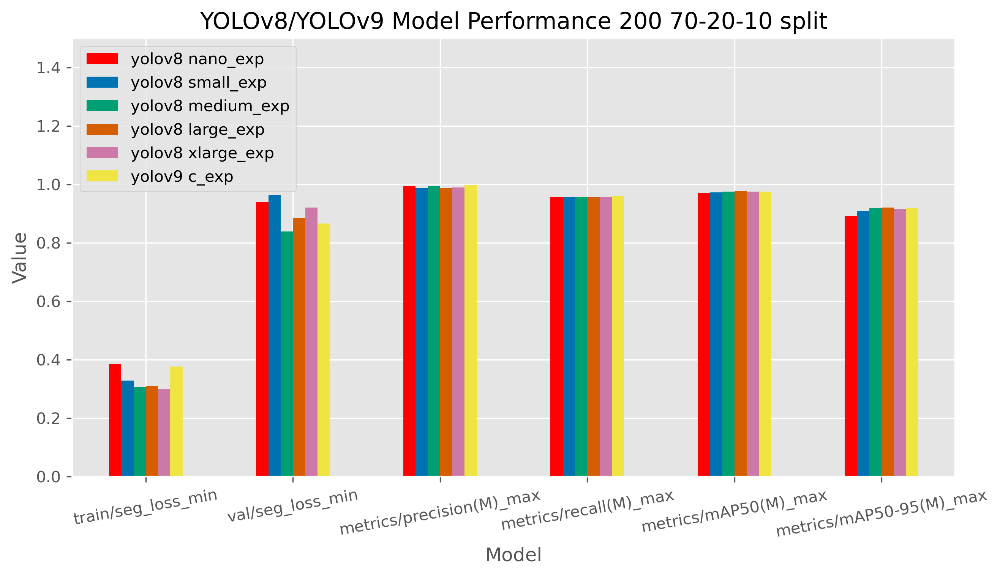

In [41]:
subset_minMax = minMax.loc[['train/seg_loss_min', 'val/seg_loss_min', 'metrics/precision(M)_max', 'metrics/recall(M)_max', 'metrics/mAP50(M)_max', 'metrics/mAP50-95(M)_max']]
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)

subset_minMax.plot(
    kind='bar', 
    title='YOLOv8/YOLOv9 Model Performance 200 70-20-10 split', 
    ylabel='Value', 
    xlabel='Model', 
    grid=True, 
    rot=10,
    color=['#FF0000', '#0072B2', '#009E73', '#D55E00', '#CC79A7', '#F0E442'],
    ylim=(0, 1.5),
    ax=ax
)

plt.show()

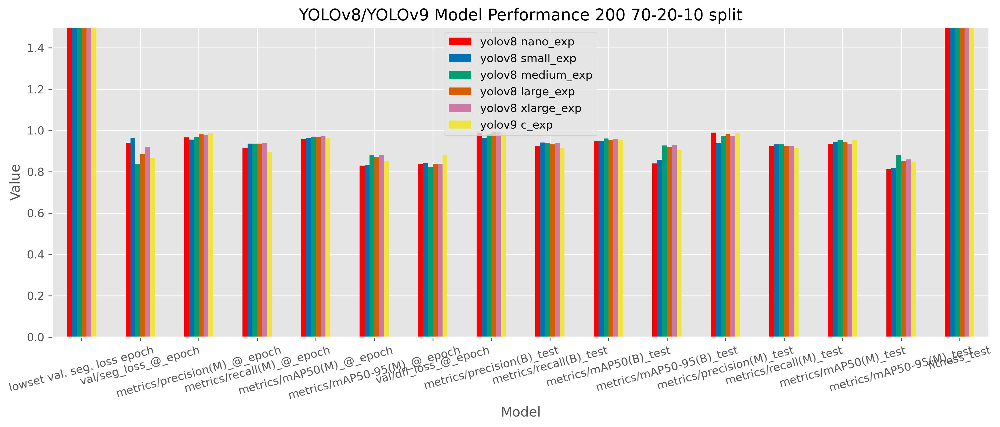

In [42]:
subset_minMax = minMax.loc[['train/seg_loss_min', 'val/seg_loss_min', 'metrics/precision(M)_max', 'metrics/recall(M)_max', 'metrics/mAP50(M)_max', 'metrics/mAP50-95(M)_max']]
fig, ax = plt.subplots(figsize=(15, 5), dpi=300)

kpi.plot(
    kind='bar', 
    title='YOLOv8/YOLOv9 Model Performance 200 70-20-10 split', 
    ylabel='Value', 
    xlabel='Model', 
    grid=True, 
    rot=15,
    color=['#FF0000', '#0072B2', '#009E73', '#D55E00', '#CC79A7', '#F0E442'],
    ylim=(0, 1.5),
    ax=ax
)

plt.show()

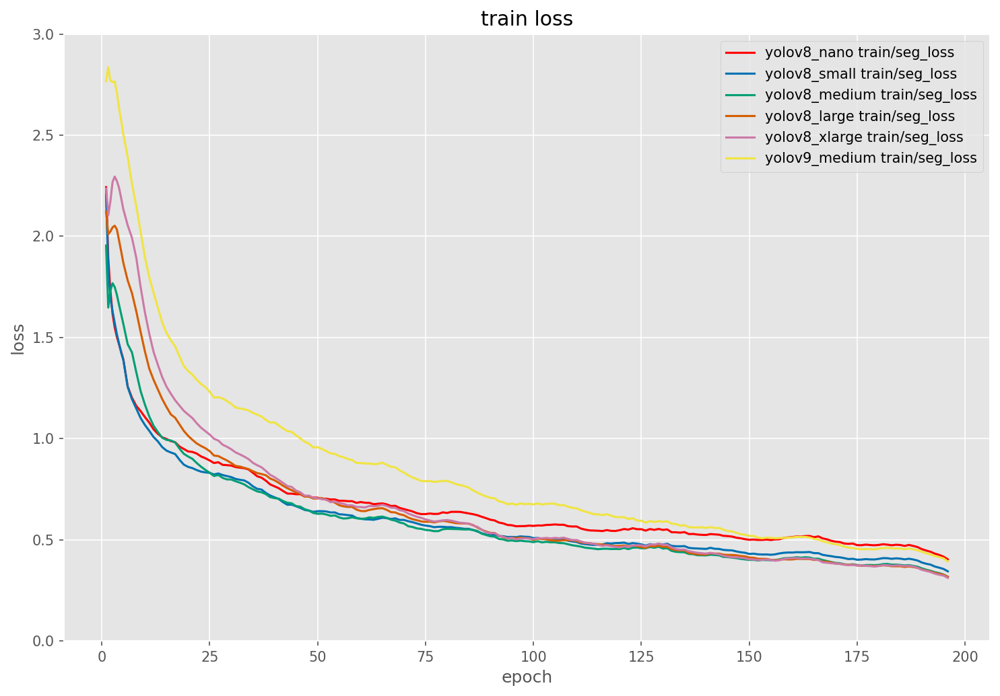

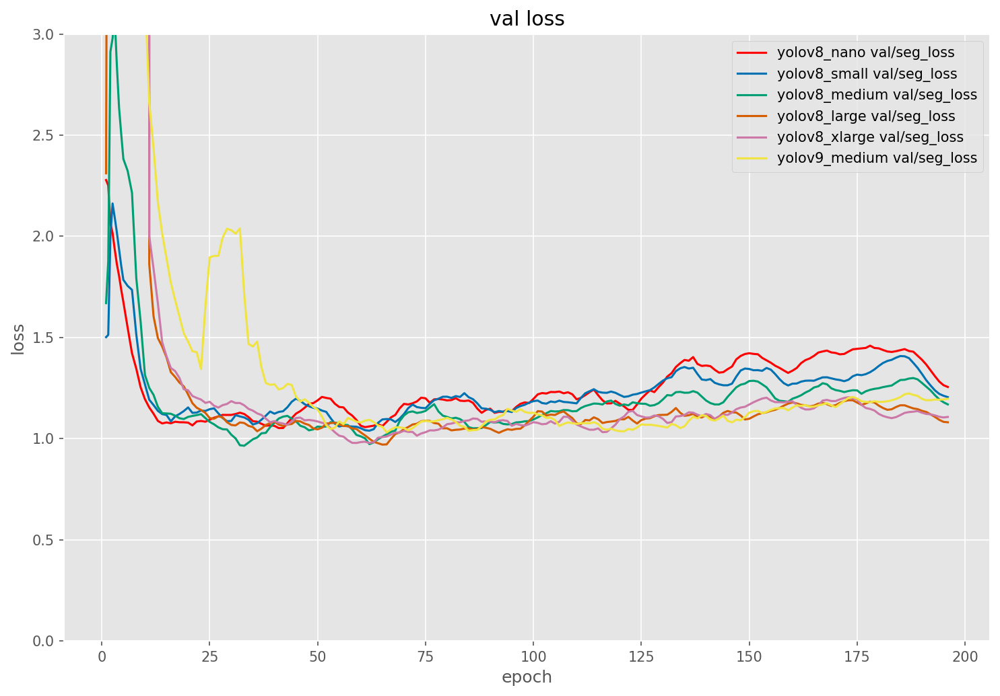

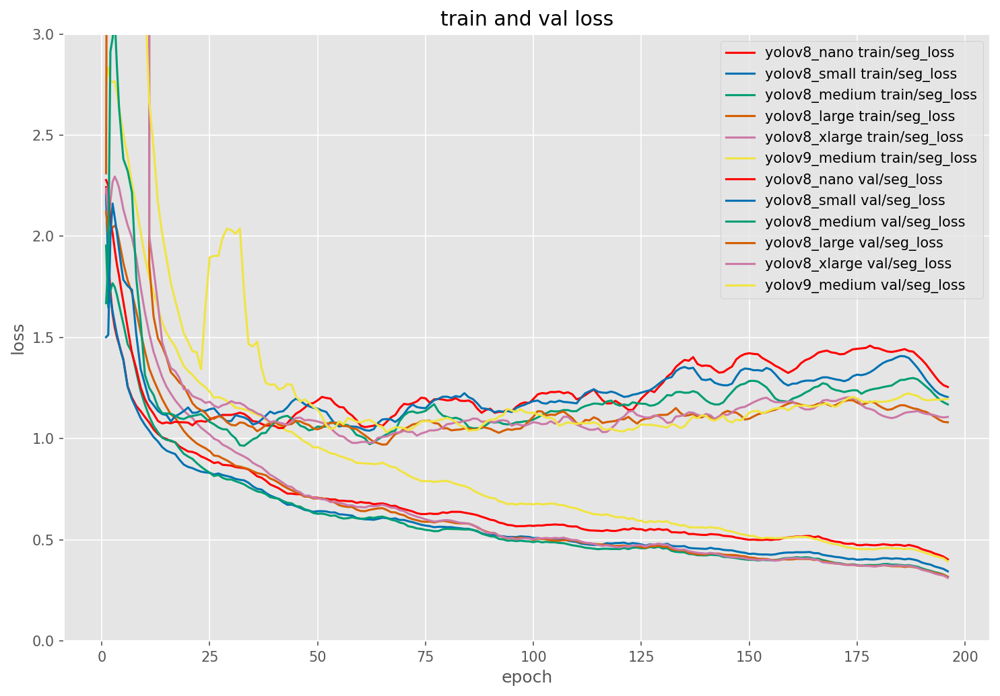

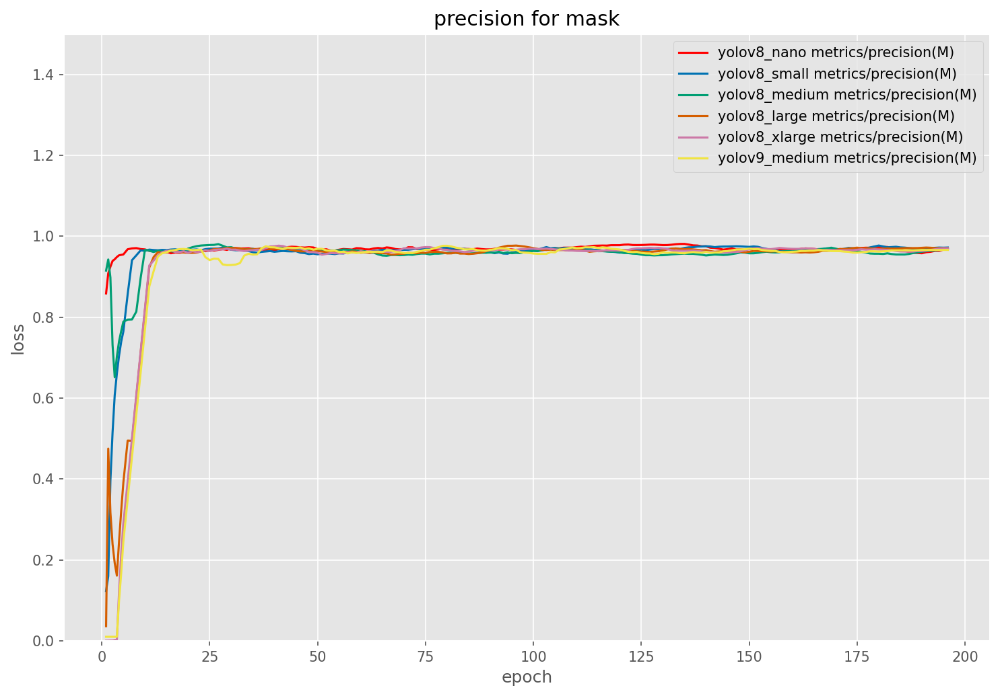

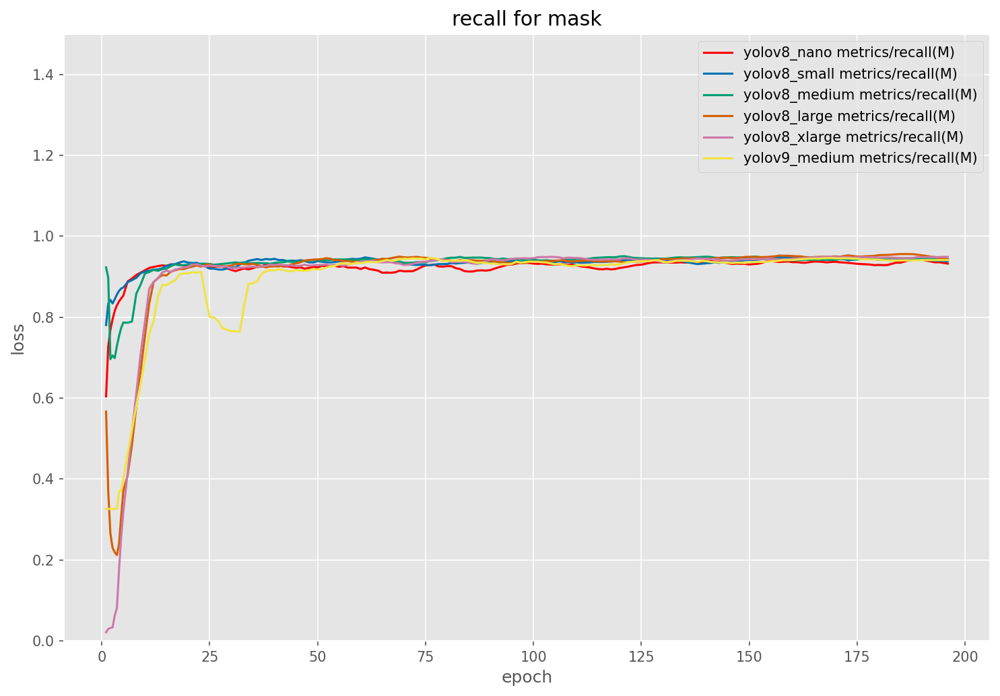

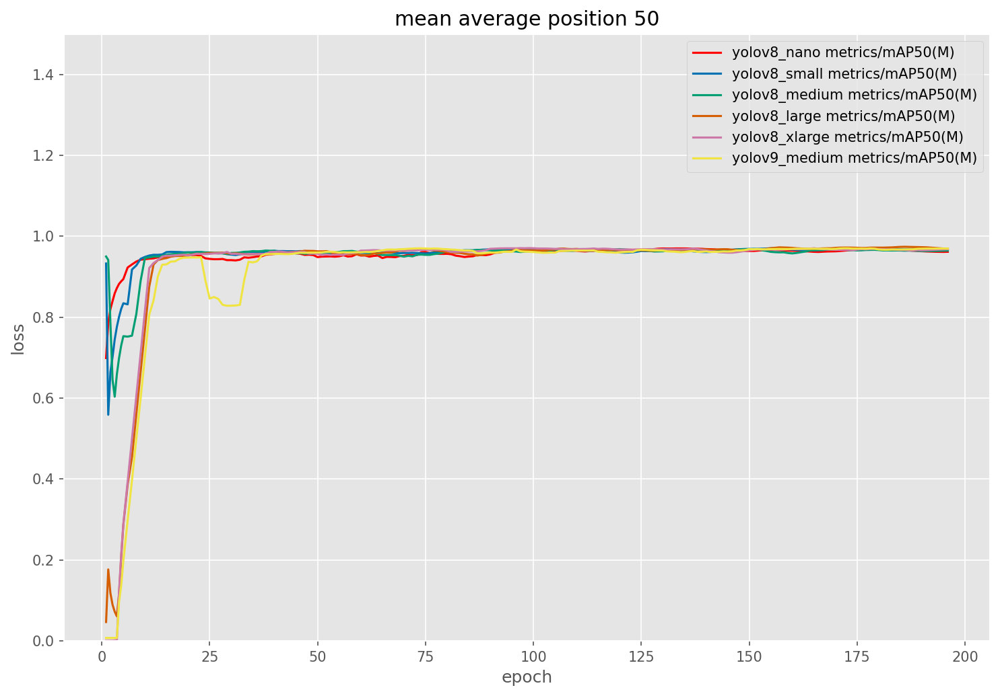

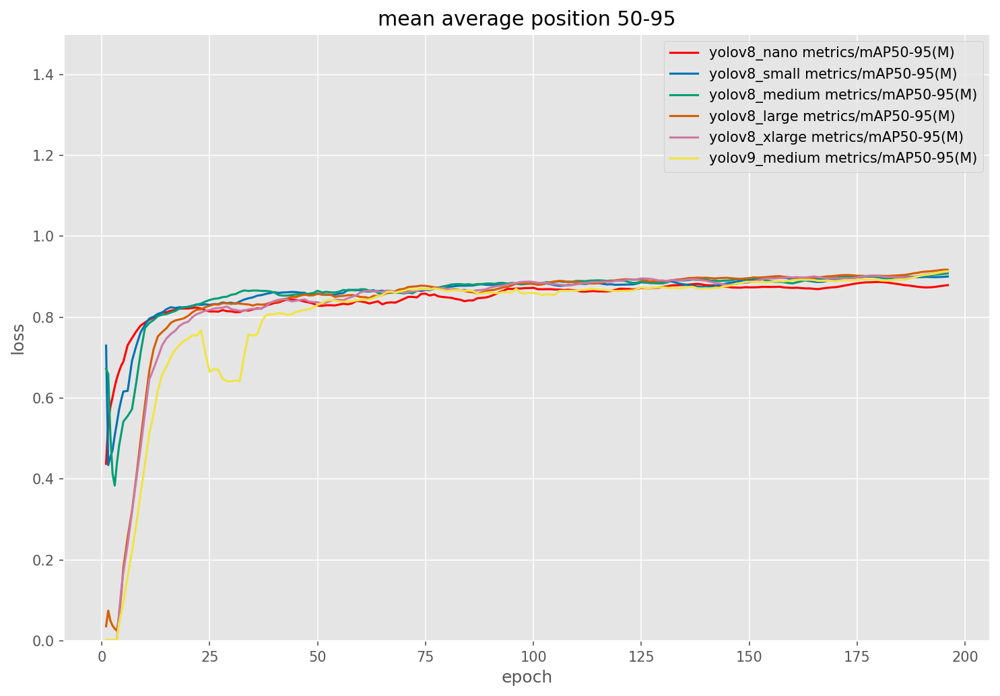

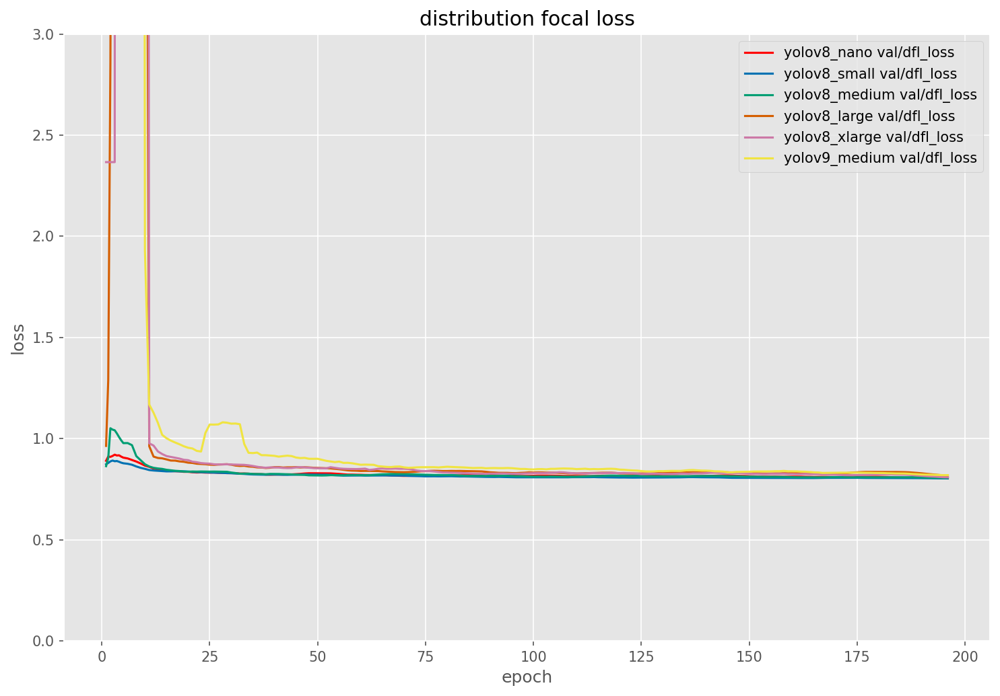

In [43]:
yolov8_nano = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 nano_exp'))))
yolov8_small = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 small_exp'))))
yolov8_medium = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 medium_exp'))))
yolov8_large = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 large_exp'))))
yolov8_xlarge = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 xlarge_exp'))))
yolov9_medium = smooth_data(clean_data(pd.read_csv(csvs.get('yolov9 c_exp'))))

plot_dataframes(yolov8_nano, yolov8_small, yolov8_medium, yolov8_large, yolov8_xlarge, yolov9_medium, column_plot_combinations, model_colors, Metrics_plot)

# scape.v5i.yolov8_70-20-10_noAug - 200 epochs NO AUG 1 - w/test
- forgot to save the goddamn models 

In [44]:
#filenames
Metrics_table = 'scape.v5i.yolov8_70-20-10_noAug-1-200-Metrics'
Metrics_plot  = 'scape.v5i.yolov8_70-20-10_noAug-1-200'
KPI_table     = 'scape.v5i.yolov8_70-20-10_noAug-1-200-KPI'

In [45]:
csv_base_path = os.path.join(BASE_DIR, 'scape.v5i.yolov8_70-20-10_noAug/200_benchmark_2_0')
csvs_folders = os.walk(csv_base_path)

csvs = OrderedDict((key, None) for key in desired_order)
for root, dirs, files in os.walk(csv_base_path):
    for file in files:
        if file.endswith(".csv"):
            key = root.split("/")[-1]
            key = root.split("/")[-1]
            if key in csvs:
                csvs[key] = os.path.join(root, file)

csvs = {k: v for k, v in csvs.items() if v is not None}

json_bast_path = os.path.join(BASE_DIR, 'scape.v5i.yolov8_70-20-10_noAug/200_benchmark_2_0_test')

jsons = OrderedDict((key, None) for key in desired_order)
for root, dirs, files in os.walk(json_bast_path):
    for file in files:
        if "results" not in file:
            continue
        if file.endswith(".json"):
            key = root.split("/")[-1]
            if key in jsons:
                jsons[key] = os.path.join(root, file)

jsons = {k: v for k, v in jsons.items() if v is not None}

In [46]:
minMax = display_KPI(csvs, jsons)

display(minMax)

dfi.export(minMax, os.path.join(VIS_DIR, f'markdown_resultater_segmentering/{Metrics_table}.png'))

,yolov8 nano_exp,yolov8 small_exp,yolov8 medium_exp,yolov8 large_exp,yolov8 xlarge_exp,yolov9 c_exp
epoch_min,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000
train/box_loss_min,0.222080,0.175600,0.149680,0.152820,0.147350,0.19506
train/seg_loss_min,0.374470,0.297350,0.277590,0.290840,0.286970,0.37822
train/cls_loss_min,0.220750,0.159040,0.142710,0.156120,0.151280,0.16679
train/dfl_loss_min,0.768290,0.762450,0.757960,0.767390,0.768810,0.79501
metrics/precision(B)_min,0.030330,0.142380,0.003670,0.000330,0.000170,0.00246
metrics/recall(B)_min,0.620320,0.513770,0.096260,0.010700,0.005350,0.08000
metrics/mAP50(B)_min,0.068290,0.137330,0.002790,0.000200,0.000090,0.00143
metrics/mAP50-95(B)_min,0.047160,0.113120,0.002260,0.000020,0.000010,0.00025
metrics/precision(M)_min,0.029330,0.145380,0.003670,0.000240,0.000330,0.00018


In [47]:
kpi = precise_KPI(csvs, jsons)

display(kpi)

dfi.export(kpi, os.path.join(VIS_DIR, f'markdown_resultater_segmentering/{KPI_table}.png'))

,yolov8 nano_exp,yolov8 small_exp,yolov8 medium_exp,yolov8 large_exp,yolov8 xlarge_exp,yolov9 c_exp
lowset val. seg. loss epoch,25.00000,42.00000,95.00000,129.00000,141.00000,68.00000
val/seg_loss_@_epoch,1.02710,1.14480,0.99578,0.97977,1.10420,0.89047
metrics/precision(M)_@_epoch,0.97132,0.97788,0.96089,0.96688,0.96118,0.96845
metrics/recall(M)_@_epoch,0.90547,0.94574,0.91971,0.93673,0.92696,0.94286
metrics/mAP50(M)_@_epoch,0.94475,0.96235,0.95053,0.95861,0.96472,0.95771
metrics/mAP50-95(M)_@_epoch,0.79828,0.82698,0.84578,0.85095,0.86661,0.85241
val/dfl_loss_@_epoch,0.86072,0.83490,0.82090,0.83058,0.83785,0.84717


<Axes: title={'center': 'YOLOv8/YOLOv9 Model Performance 200 benchmark'}, xlabel='Model', ylabel='Value'>

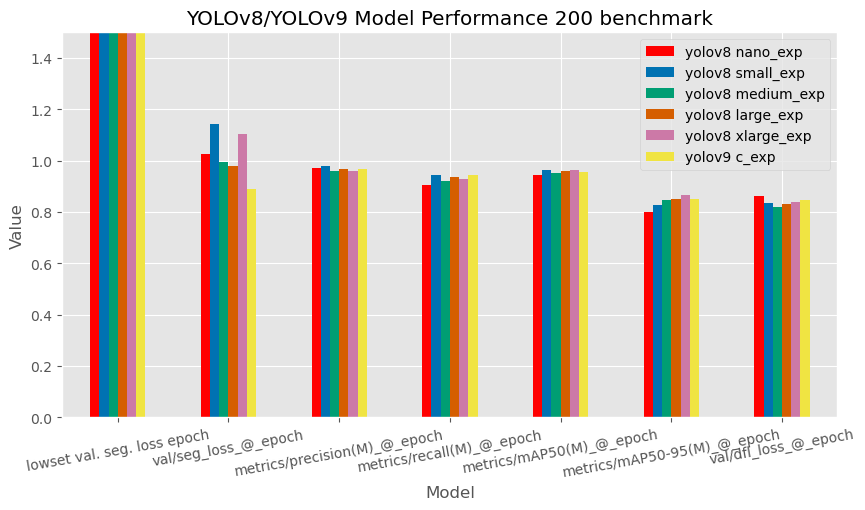

In [48]:
kpi.plot(
    kind='bar', 
    title='YOLOv8/YOLOv9 Model Performance 200 benchmark', 
    ylabel='Value', 
    xlabel='Model', 
    figsize=(10, 5), 
    grid=True, 
    rot=10,
    color=['#FF0000', '#0072B2', '#009E73', '#D55E00', '#CC79A7', '#F0E442'],
    ylim=(0, 1.5)
    )

<Axes: title={'center': 'YOLOv8/YOLOv9 Model Performance 200 benchmark augmented single class'}, xlabel='Model', ylabel='Value'>

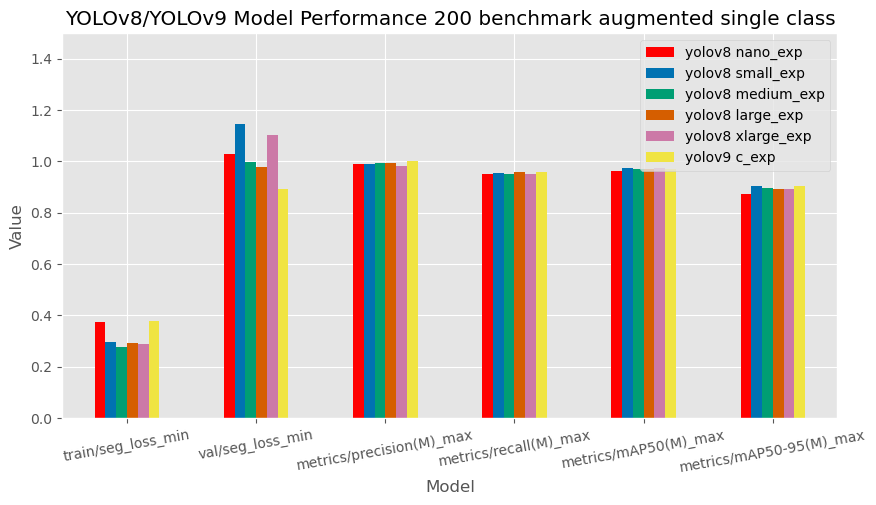

In [49]:
subset_minMax = minMax.loc[['train/seg_loss_min', 'val/seg_loss_min', 'metrics/precision(M)_max', 'metrics/recall(M)_max', 'metrics/mAP50(M)_max', 'metrics/mAP50-95(M)_max']]
subset_minMax.plot(
    kind='bar', 
    title='YOLOv8/YOLOv9 Model Performance 200 benchmark augmented single class', 
    ylabel='Value', 
    xlabel='Model', 
    figsize=(10, 5),
    grid=True, 
    rot=10,
    color=['#FF0000', '#0072B2', '#009E73', '#D55E00', '#CC79A7', '#F0E442'],
    ylim=(0, 1.5)
    )

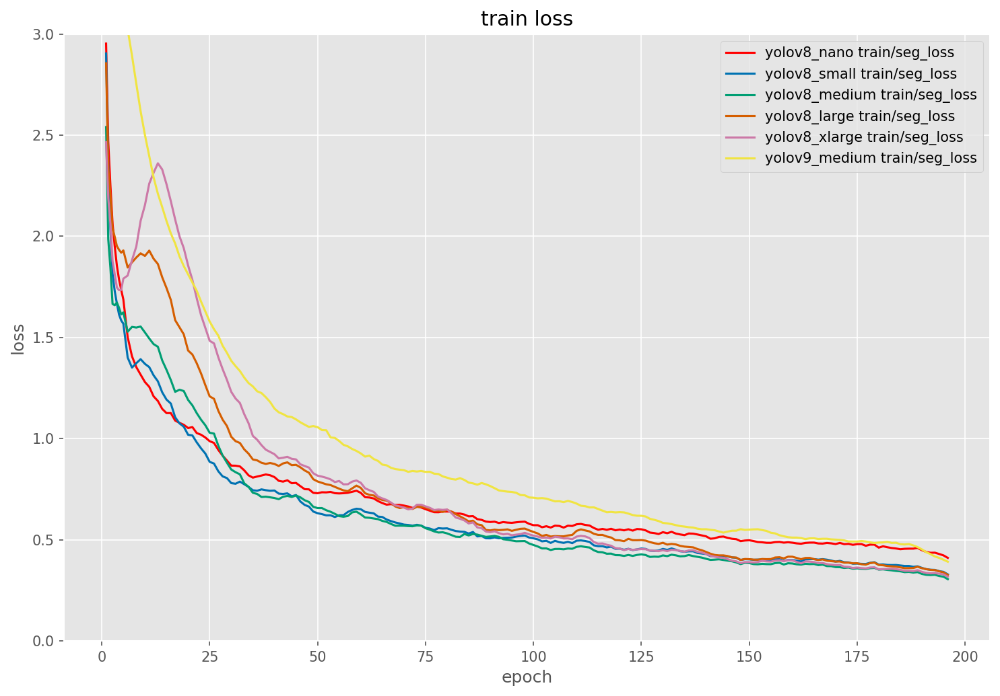

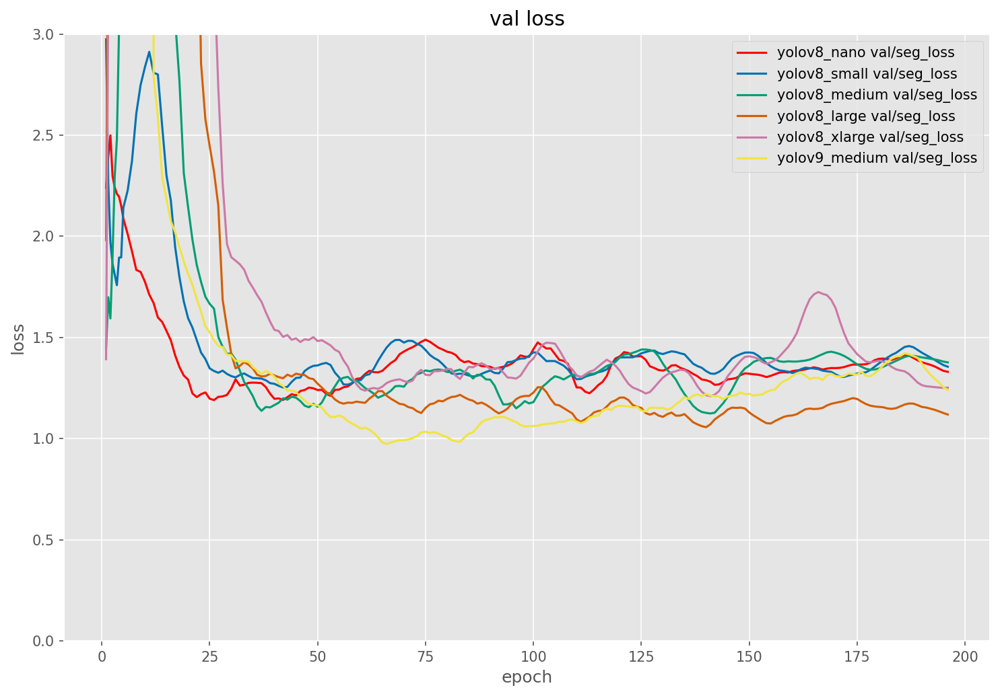

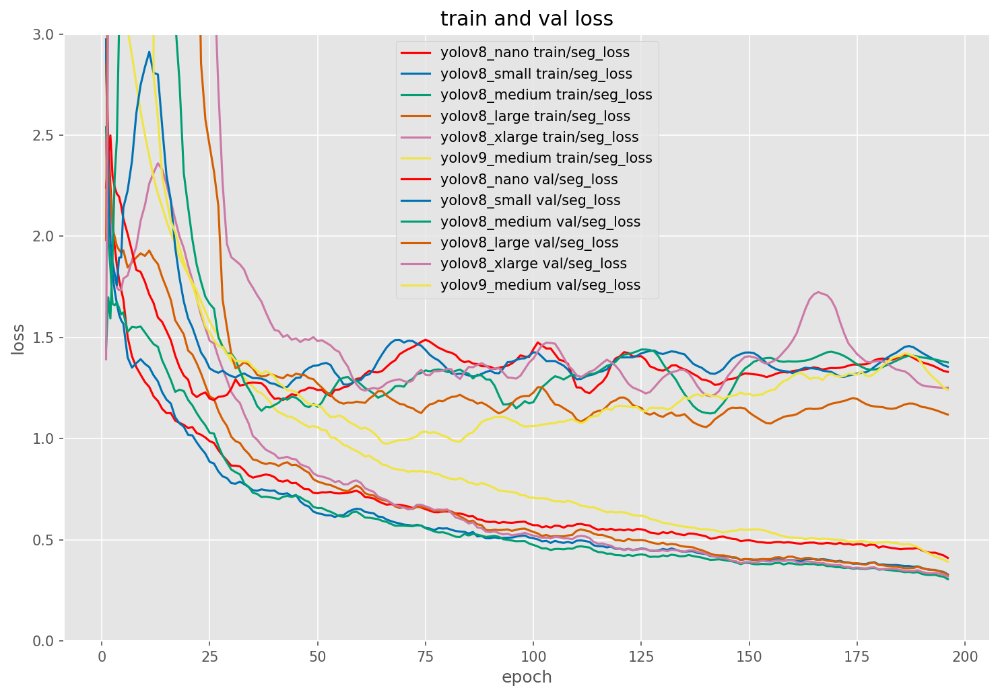

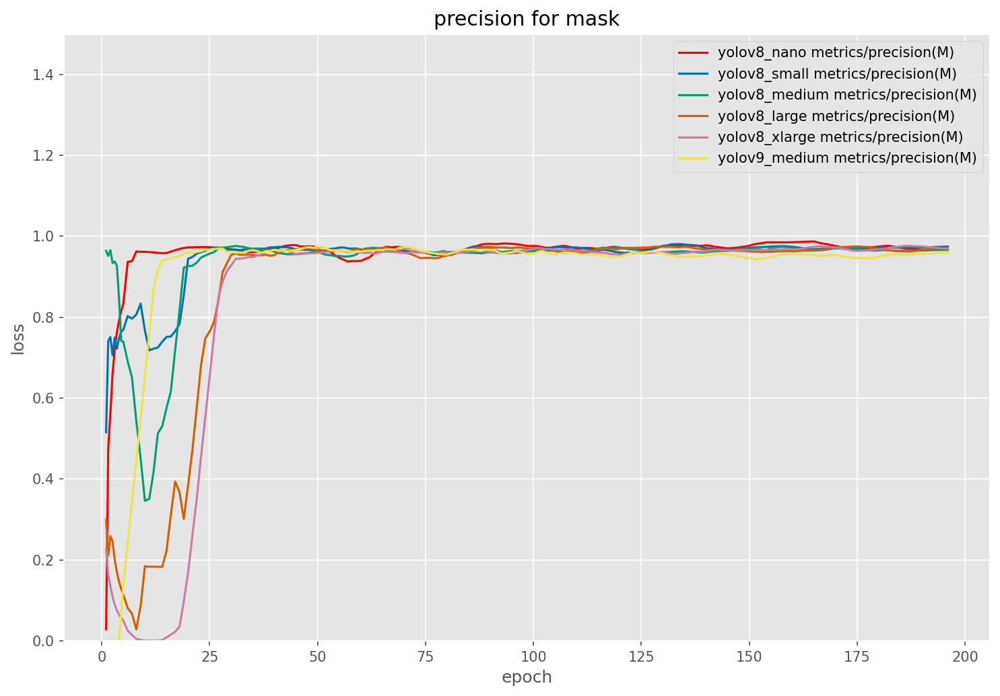

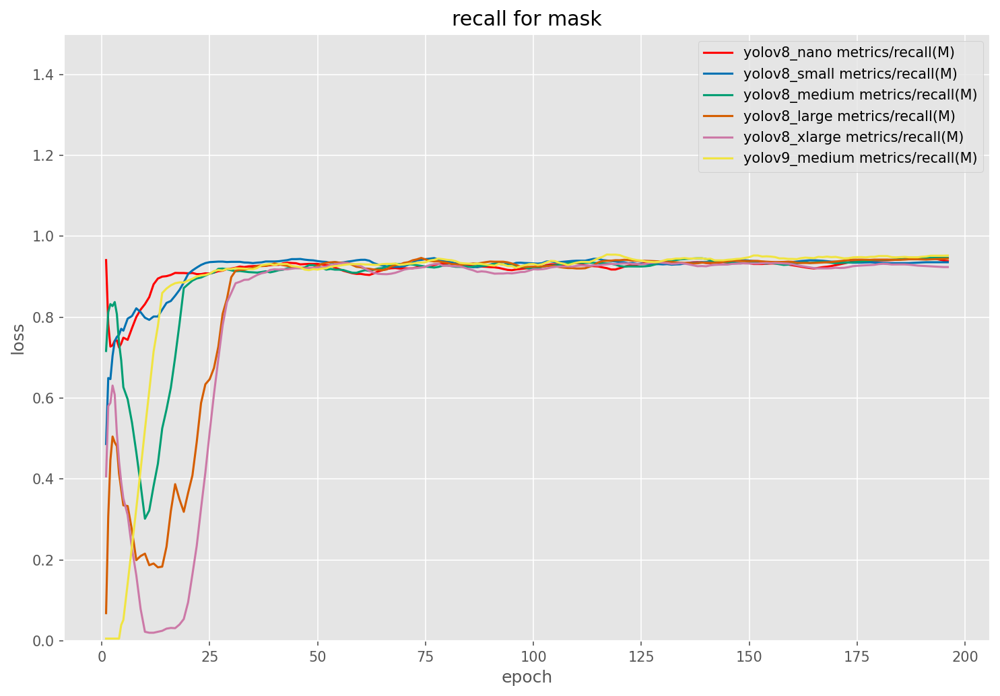

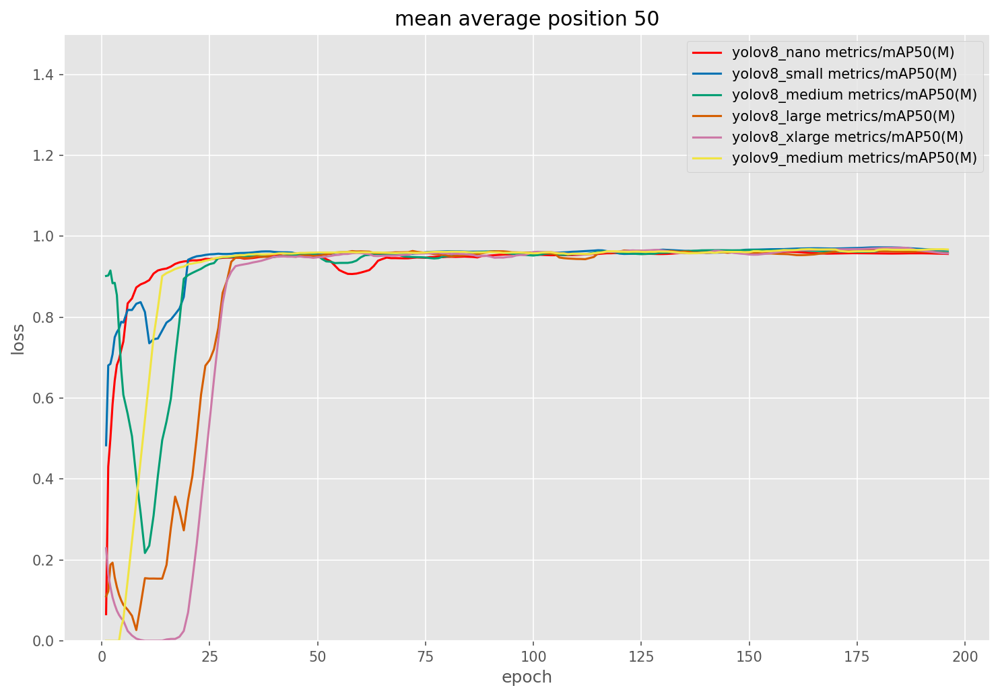

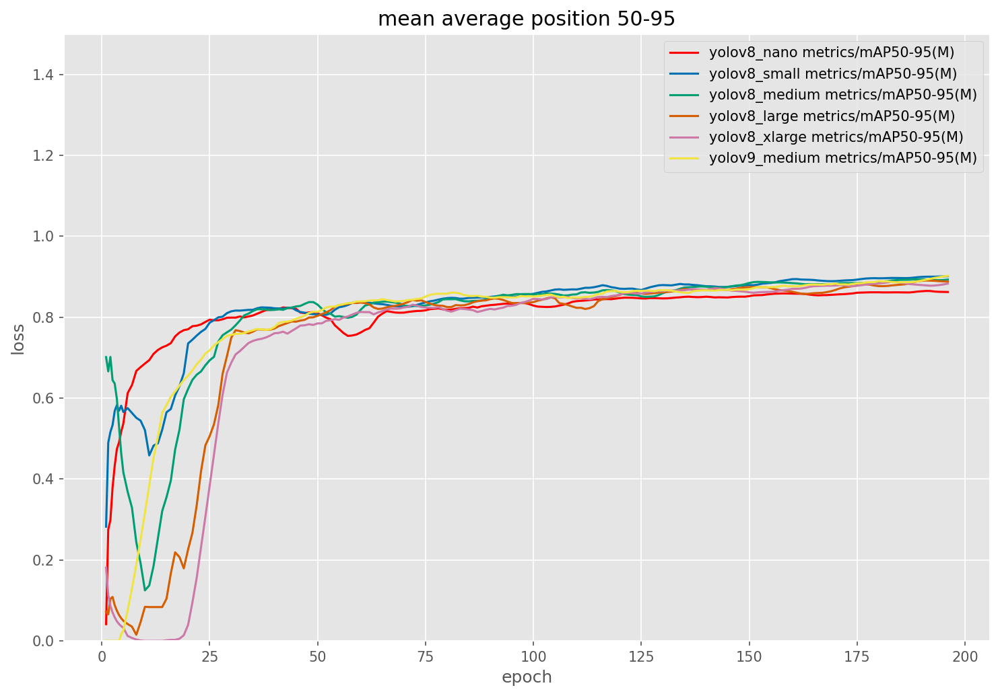

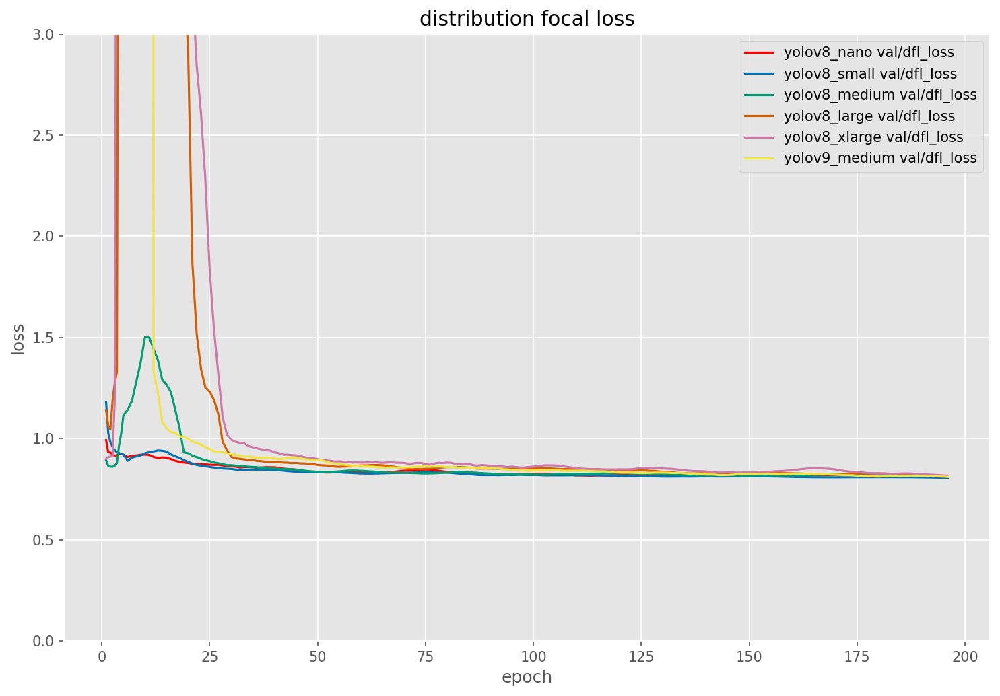

In [50]:
yolov8_nano = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 nano_exp'))))
yolov8_small = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 small_exp'))))
yolov8_medium = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 medium_exp'))))
yolov8_large = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 large_exp'))))
yolov8_xlarge = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 xlarge_exp'))))
yolov9_medium = smooth_data(clean_data(pd.read_csv(csvs.get('yolov9 c_exp'))))

plot_dataframes(yolov8_nano, yolov8_small, yolov8_medium, yolov8_large, yolov8_xlarge, yolov9_medium, column_plot_combinations, model_colors, Metrics_plot)

# scape.v5i.yolov8_70-20-10_noAug - 200 epochs NO AUG 2 - w/test

In [51]:
#filenames
Metrics_table = 'scape.v5i.yolov8_70-20-10_noAug-2-200-Metrics'
Metrics_plot  = 'scape.v5i.yolov8_70-20-10_noAug-2-200'
KPI_table     = 'scape.v5i.yolov8_70-20-10_noAug-2-200-KPI'

In [52]:
csv_base_path = os.path.join(BASE_DIR, 'scape.v5i.yolov8_70-20-10_noAug/200_benchmark_2_1')
csvs_folders = os.walk(csv_base_path)

csvs = OrderedDict((key, None) for key in desired_order)
for root, dirs, files in os.walk(csv_base_path):
    for file in files:
        if file.endswith(".csv"):
            key = root.split("/")[-1]
            key = root.split("/")[-1]
            if key in csvs:
                csvs[key] = os.path.join(root, file)

csvs = {k: v for k, v in csvs.items() if v is not None}

json_bast_path = os.path.join(BASE_DIR, 'scape.v5i.yolov8_70-20-10_noAug/200_benchmark_2_1_test')

jsons = OrderedDict((key, None) for key in desired_order)
for root, dirs, files in os.walk(json_bast_path):
    for file in files:
        if "results" not in file:
            continue
        if file.endswith(".json"):
            key = root.split("/")[-1]
            if key in jsons:
                jsons[key] = os.path.join(root, file)

jsons = {k: v for k, v in jsons.items() if v is not None}

In [53]:
minMax = display_KPI(csvs, jsons)

display(minMax)

dfi.export(minMax, os.path.join(VIS_DIR, f'markdown_resultater_segmentering/{Metrics_table}.png'))

,yolov8 nano_exp,yolov8 small_exp,yolov8 medium_exp,yolov8 large_exp,yolov8 xlarge_exp,yolov9 c_exp
epoch_min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
train/box_loss_min,0.222080,0.175600,0.149680,0.152820,0.147350,0.195060
train/seg_loss_min,0.374470,0.297350,0.277590,0.290840,0.286970,0.378220
train/cls_loss_min,0.220750,0.159040,0.142710,0.156120,0.151280,0.166790
train/dfl_loss_min,0.768290,0.762450,0.757960,0.767390,0.768810,0.795010
metrics/precision(B)_min,0.030330,0.142380,0.003670,0.000330,0.000170,0.002460
metrics/recall(B)_min,0.620320,0.513770,0.096260,0.010700,0.005350,0.080000
metrics/mAP50(B)_min,0.068290,0.137330,0.002790,0.000200,0.000090,0.001430
metrics/mAP50-95(B)_min,0.047160,0.113120,0.002260,0.000020,0.000010,0.000250
metrics/precision(M)_min,0.029330,0.145380,0.003670,0.000240,0.000330,0.000180


In [54]:
kpi = precise_KPI(csvs, jsons)

display(kpi)

dfi.export(kpi, os.path.join(VIS_DIR, f'markdown_resultater_segmentering/{KPI_table}.png'))

,yolov8 nano_exp,yolov8 small_exp,yolov8 medium_exp,yolov8 large_exp,yolov8 xlarge_exp,yolov9 c_exp
lowset val. seg. loss epoch,25.000000,42.000000,95.000000,129.000000,141.000000,68.000000
val/seg_loss_@_epoch,1.027100,1.144800,0.995780,0.979770,1.104200,0.890470
metrics/precision(M)_@_epoch,0.971320,0.977880,0.960890,0.966880,0.961180,0.968450
metrics/recall(M)_@_epoch,0.905470,0.945740,0.919710,0.936730,0.926960,0.942860
metrics/mAP50(M)_@_epoch,0.944750,0.962350,0.950530,0.958610,0.964720,0.957710
metrics/mAP50-95(M)_@_epoch,0.798280,0.826980,0.845780,0.850950,0.866610,0.852410
val/dfl_loss_@_epoch,0.860720,0.834900,0.820900,0.830580,0.837850,0.847170
metrics/precision(B)_test,0.981806,0.962508,0.989498,0.981656,0.980074,0.999350
metrics/recall(B)_test,0.906972,0.924370,0.924370,0.941176,0.932773,0.949580
metrics/mAP50(B)_test,0.941076,0.947861,0.956647,0.963903,0.957911,0.957006


<Axes: title={'center': 'YOLOv8/YOLOv9 Model Performance 200 benchmark augmented single class'}, xlabel='Model', ylabel='Value'>

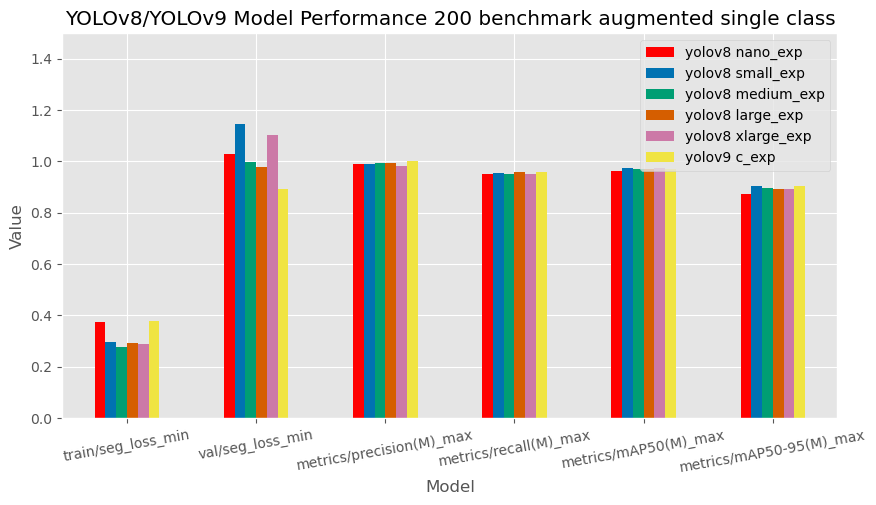

In [55]:
subset_minMax = minMax.loc[['train/seg_loss_min', 'val/seg_loss_min', 'metrics/precision(M)_max', 'metrics/recall(M)_max', 'metrics/mAP50(M)_max', 'metrics/mAP50-95(M)_max']]
subset_minMax.plot(
    kind='bar', 
    title='YOLOv8/YOLOv9 Model Performance 200 benchmark augmented single class', 
    ylabel='Value', 
    xlabel='Model', 
    figsize=(10, 5),
    grid=True, 
    rot=10,
    color=['#FF0000', '#0072B2', '#009E73', '#D55E00', '#CC79A7', '#F0E442'],
    ylim=(0, 1.5)
    )

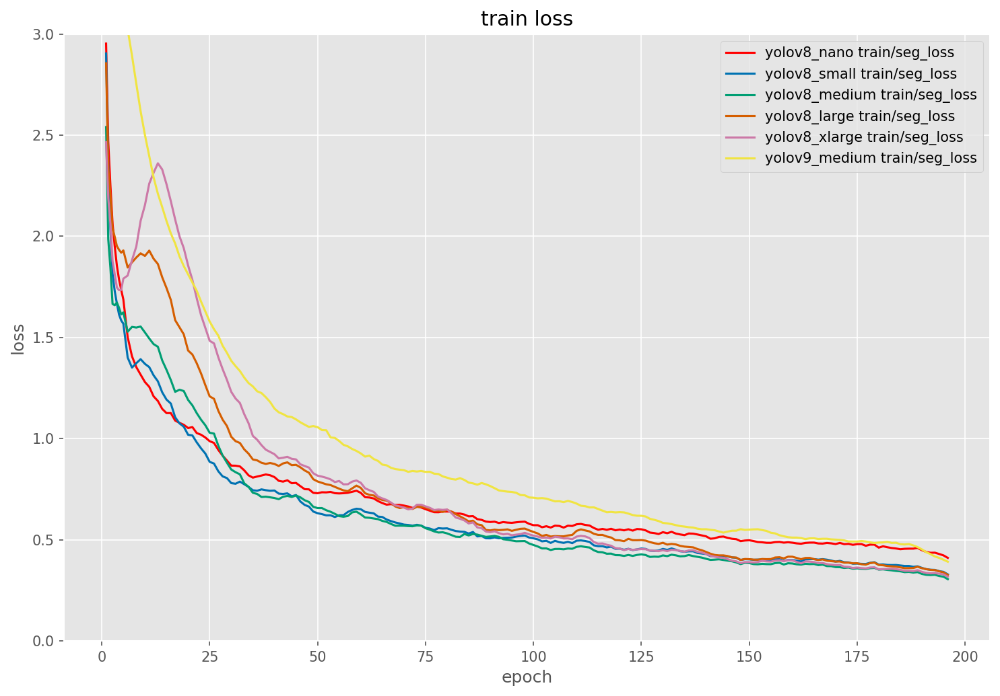

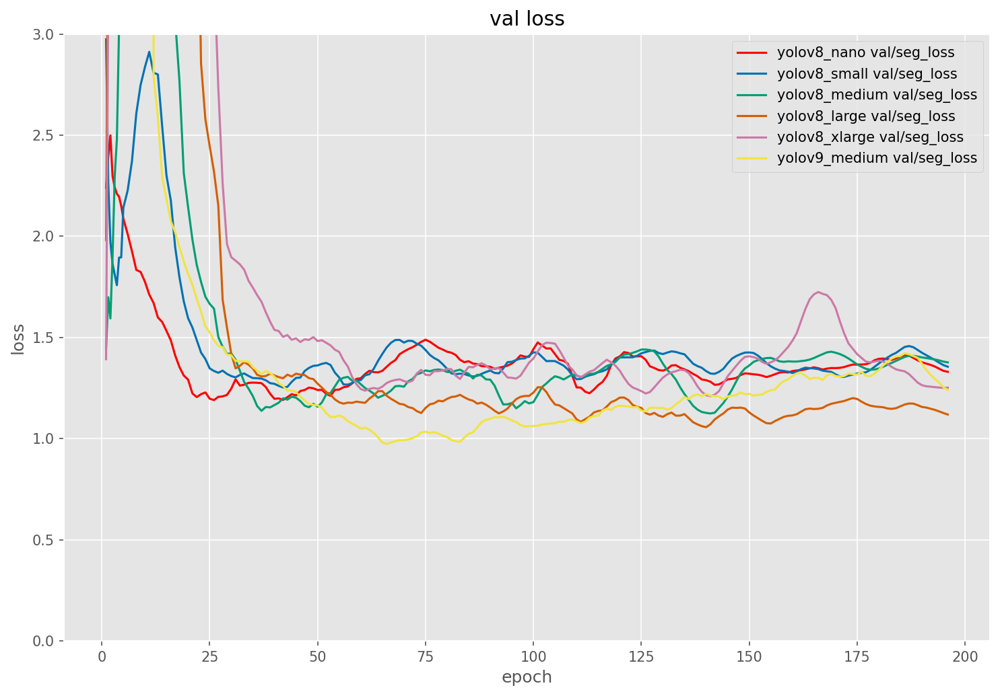

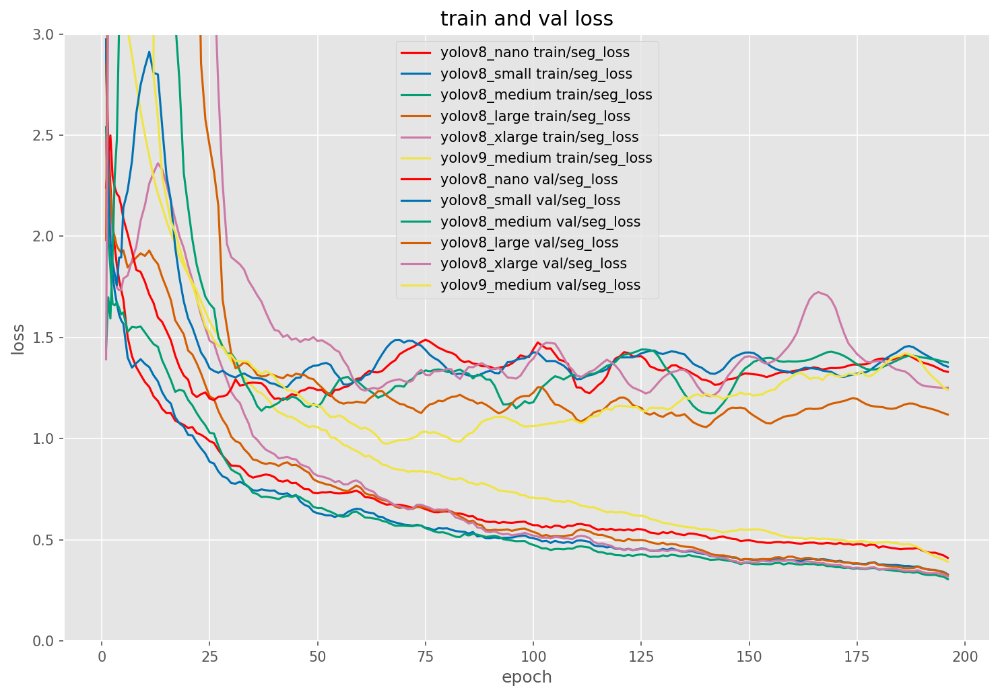

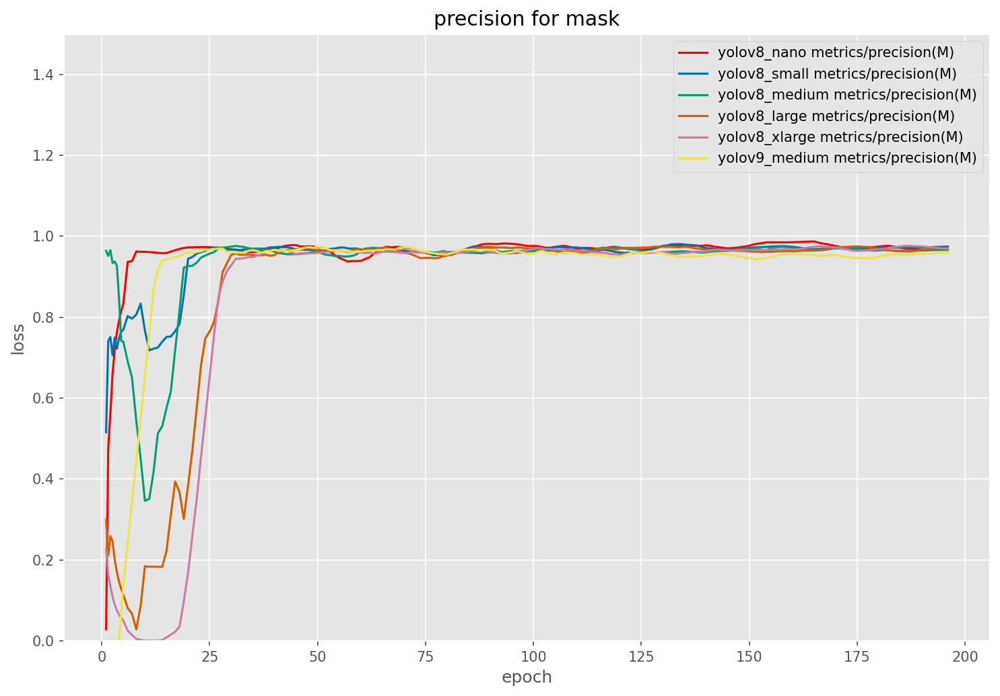

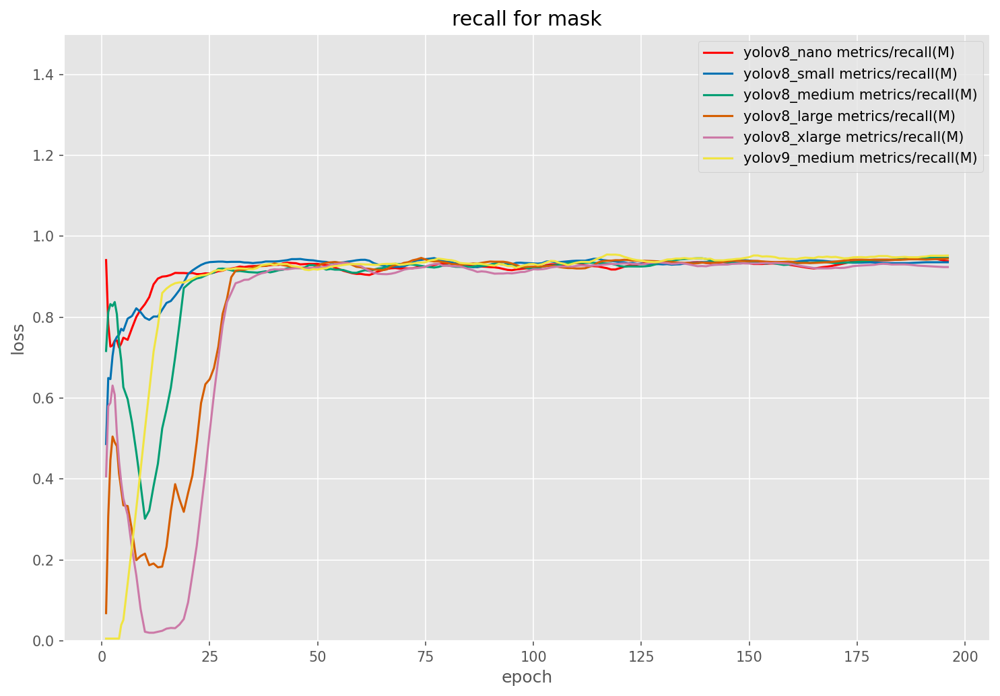

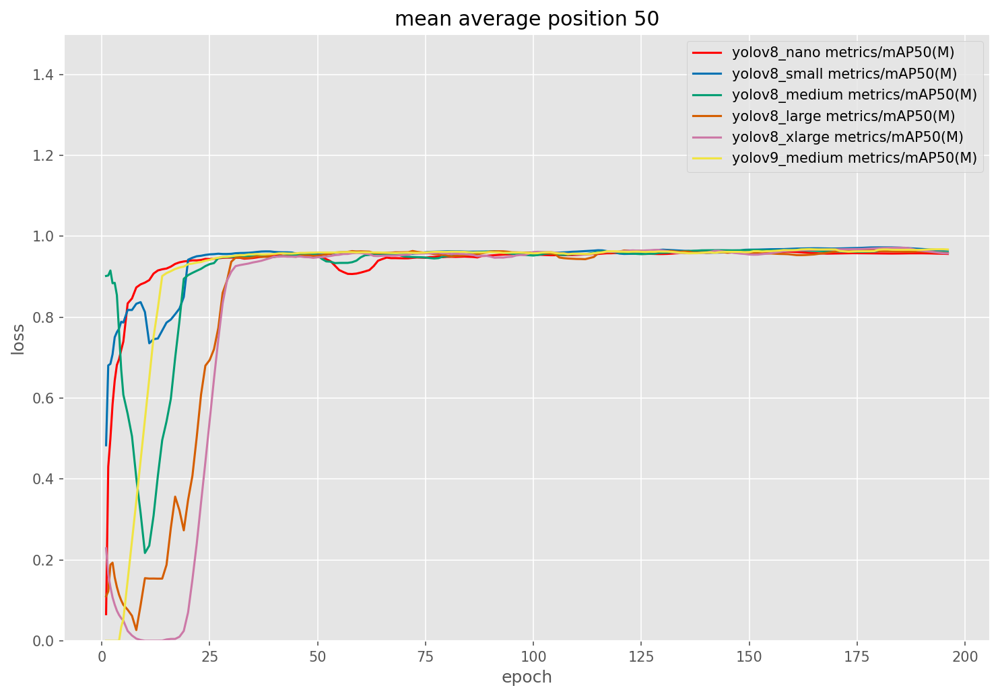

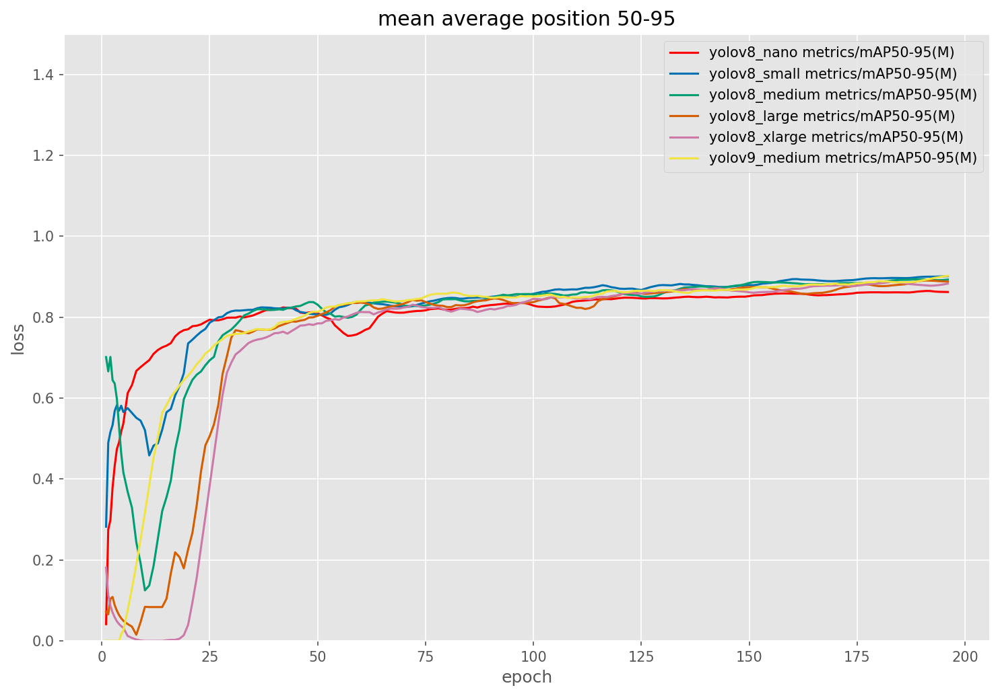

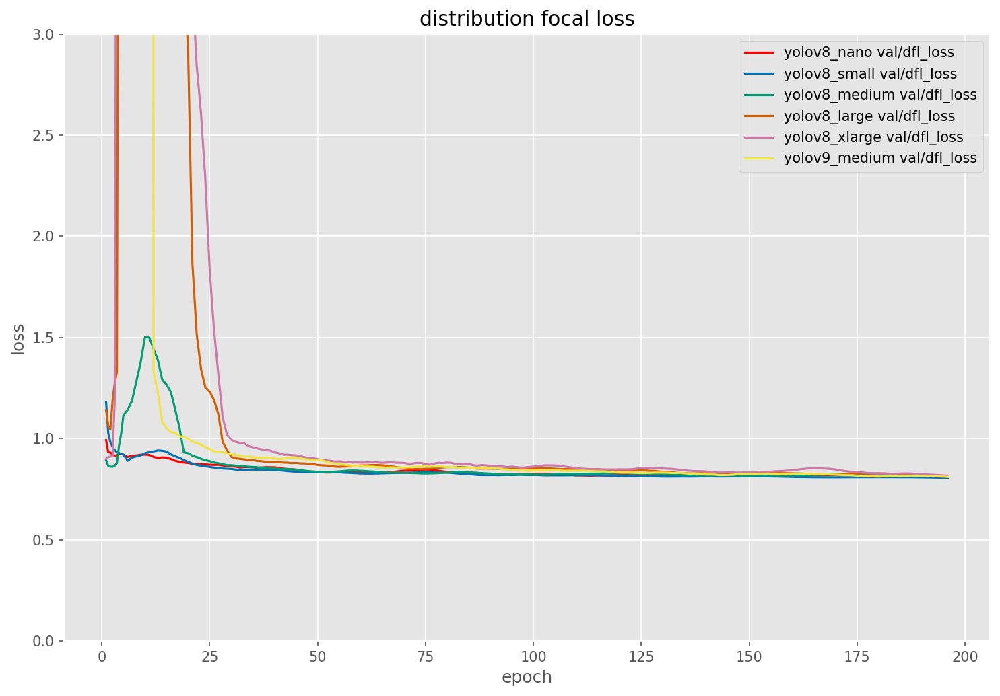

In [56]:
yolov8_nano = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 nano_exp'))))
yolov8_small = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 small_exp'))))
yolov8_medium = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 medium_exp'))))
yolov8_large = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 large_exp'))))
yolov8_xlarge = smooth_data(clean_data(pd.read_csv(csvs.get('yolov8 xlarge_exp'))))
yolov9_medium = smooth_data(clean_data(pd.read_csv(csvs.get('yolov9 c_exp'))))

plot_dataframes(yolov8_nano, yolov8_small, yolov8_medium, yolov8_large, yolov8_xlarge, yolov9_medium, column_plot_combinations, model_colors, Metrics_plot)